**Introduction:**

As co-founders of a startup aiming to provide risk evaluation as a service for retail banks, and to identify machine learning as a crucial element in capturing statistical patterns related to defaults on bank loans. To kickstart it, obtained a dataset from Home Credit Group and plan to leverage it to develop a proof-of-concept (POC) product. Our vision is to create a diverse range of models to offer a robust solution that can cater to the specific needs of potential clients.

**Goals:**

Develop a proof-of-concept (POC) product that provides risk evaluation as a service for retail banks using machine learning.

Identify the most crucial problem(s) faced by potential bank clients regarding risk evaluation and default prediction.


Perform exploratory data analysis (EDA) on the Home Credit Group dataset to gain insights into the data distribution, patterns, and potential predictors.

Engineer and create meaningful features from the dataset to enhance model performance and predictive capabilities.


Train and evaluate multiple machine learning models to predict the likelihood of loan defaults accurately.


Deploy the machine learning models as part of the POC product to demonstrate its effectiveness in assessing loan risks for potential bank clients.



**Objectives:**

Conduct a meeting with potential bank clients to understand their specific pain points and requirements related to risk evaluation and default prediction.


Preprocess and clean the Home Credit Group dataset, handling missing values and ensuring data quality.


Perform exploratory data analysis (EDA) to identify patterns, correlations, and potential predictors in the data.



Engineer relevant features that can provide valuable insights into loan applicants' creditworthiness and repayment capabilities.
Split the dataset into training and testing sets for model training and evaluation purposes.



Train and compare multiple machine learning models, such as logistic regression, decision trees, random forests, gradient boosting, and neural networks, to determine the most suitable models for the POC product.



Utilize statistical inference procedures, such as hypothesis testing, to validate the significance of selected features and model performance.
Optimize the selected models by tuning hyperparameters to achieve the best possible performance.


Develop a user-friendly interface to showcase the POC product, allowing potential bank clients to interact with and understand the risk evaluation process better.



Deploy the trained machine learning models as a cloud-based service to demonstrate the product's functionality in real-time.


Collaborate with the sales and operations team to align the POC product's offering with potential clients' needs and expectations.



Present the POC product to potential bank clients, highlighting its effectiveness in evaluating risks and predicting defaults accurately.


By aligning our efforts, I aim to create a compelling offering that addresses the needs of retail banks, ultimately leading to successful partnerships and growth for our startup.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
from scipy import stats
from collections import Counter, OrderedDict
from pandas.api.types import is_object_dtype, is_numeric_dtype
import statsmodels.api as sm
import plotly.express as px
from sklearn.preprocessing import (
    OneHotEncoder,
    StandardScaler,
    OrdinalEncoder,
    LabelEncoder,
)
import sklearn
import warnings

warnings.filterwarnings("ignore")
import pickle
from sklearn.model_selection import train_test_split
import category_encoders as ce
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    recall_score,
    f1_score,
    fbeta_score,
)
from xgboost import XGBClassifier, XGBRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
import eli5
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from lightgbm import LGBMClassifier
from imblearn.over_sampling import SMOTE, SVMSMOTE, SMOTENC
from imblearn.pipeline import make_pipeline
from catboost import CatBoostClassifier
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import train_test_split, cross_val_score
import joblib
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import precision_recall_curve
from imblearn.under_sampling import RandomUnderSampler
import shap



pd.options.display.float_format = "{:.2f}".format
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
app_train = pd.read_csv("/content/drive/MyDrive/credit/application_train.csv")
app_test = pd.read_csv("/content/drive/MyDrive/credit/application_test.csv")
bureau_df = pd.read_csv("/content/drive/MyDrive/credit/bureau.csv")
bureau_bal = pd.read_csv("/content/drive/MyDrive/credit/bureau_balance.csv")
credit_card_bal = pd.read_csv("/content/drive/MyDrive/credit/credit_card_balance.csv")
previous_app = pd.read_csv("/content/drive/MyDrive/credit/previous_application.csv")
pos_cash_bal = pd.read_csv("/content/drive/MyDrive/credit/POS_CASH_balance.csv")
installments = pd.read_csv("/content/drive/MyDrive/credit/installments_payments.csv")


**App_train**

In [ ]:
# Info
print("Info for app_train:")
print(app_train.info())


Info for app_train:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


In [ ]:
# Head
print("Head of app_train:")
app_train.head()


Head of app_train:


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,351000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-9461,-637,-3648.00,-2120,NaN,1,1,0,1,1,0,Laborers,1.00,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.08,0.26,0.14,0.02,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,0.03,0.04,0.97,0.63,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,0.03,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,reg oper account,block of flats,0.01,"Stone, brick",No,2.00,2.00,2.00,2.00,-1134.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,1.00
1,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-16765,-1188,-1186.00,-291,NaN,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.31,0.62,NaN,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.05,0.00,0.01,0.09,0.05,0.99,0.80,0.05,0.08,0.03,0.29,0.33,0.01,0.08,0.06,0.00,0.00,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.06,0.00,0.01,reg oper account,block of flats,0.07,Block,No,1.00,0.00,1.00,0.00,-828.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
2,100004,0,Revolving loans,M,Y,Y,0,67500.00,135000.00,6750.00,135000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,-19046,-225,-4260.00,-2531,26.00,1,1,1,1,1,0,Laborers,1.00,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.56,0.73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,-815.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.0

In [ ]:
# Shape
print("Shape of app_train:", app_train.shape)

Shape of app_train: (307511, 122)


In [ ]:
# Null values
print("Null values in app_train:")
print(app_train.isnull().sum())

Null values in app_train:
SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0

There are many null values exist in th dataset

In [ ]:
print("Number of duplicates in app_train:", app_train.duplicated().sum())


Number of duplicates in app_train: 0


No duplicates were identified in the given file

In [ ]:
# Descriptive statistics
print("Descriptive statistics for app_train:")
app_train.describe()

Descriptive statistics for app_train:


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.00,307511.00,307511.00,307511.00,307511.00,307499.00,307233.00,307511.00,307511.00,307511.00,307511.00,307511.00,104582.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307509.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,134133.00,306851.00,246546.00,151450.00,127568.00,157504.00,103023.00,92646.00,143620.00,152683.00,154491.00,98869.00,124921.00,97312.00,153161.00,93997.00,137829.00,151450.00,127568.00,157504.00,103023.00,92646.00,143620.00,152683.00,154491.00,98869.00,124921.00,97312.00,153161.00,93997.00,137829.00,151450.00,127568.00,157504.00,103023.00,92646.00,143620.00,152683.00,154491.00,98869.00,124921.00,97312.00,153161.00,93997.00,137829.00,159080.00,306490.00,306490.00,306490.00,306490.00,307510.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,265992.00,265992.00,265992.00,265992.00,265992.00,265992.00
mean,278180.52,0.08,0.42,168797.92,599026.00,27108.57,538396.21,0.02,-16037.00,63815.05,-4986.12,-2994.20,12.06,1.00,0.82,0.20,1.00,0.28,0.06,2.15,2.05,2.03,12.06,0.02,0.05,0.04,0.08,0.23,0.18,0.50,0.51,0.51,0.12,0.09,0.98,0.75,0.04,0.08,0.15,0.23,0.23,0.07,0.10,0.11,0.01,0.03,0.11,0.09,0.98,0.76,0.04,0.07,0.15,0.22,0.23,0.06,0.11,0.11,0.01,0.03,0.12,0.09,0.98,0.76,0.04,0.08,0.15,0.23,0.23,0.07,0.10,0.11,0.01,0.03,0.10,1.42,0.14,1.41,0.10,-962.86,0.00,0.71,0.00,0.02,0.09,0.00,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.01,0.00,0.00,0.00,0.01,0.01,0.03,0.27,0.27,1.90
std,102790.18,0.27,0.72,237123.15,402490.78,14493.74,369446.46,0.01,4363.99,141275.77,3522.89,1509.45,11.94,0.00,0.38,0.40,0.04,0.45,0.23,0.91,0.51,0.50,3.27,0.12,0.22,0.20,0.27,0.42,0.38,0.21,0.19,0.19,0.11,0.08,0.06,0.11,0.08,0.13,0.10,0.14,0.16,0.08,0.09,0.11,0.05,0.07,0.11,0.08,0.06,0.11,0.07,0.13,0.10,0.14,0.16,0.08,0.10,0.11,0.05,0.07,0.11,0.08,0.06,0.11,0.08,0.13,0.10,0.15,0.16,0.08,0.09,0.11,0.05,0.07,0.11,2.40,0.45,2.38,0.36,826.81,0.

Target Variable (TARGET): The target variable appears to be imbalanced, with approximately 8% of applicants having difficulty repaying their loans (TARGET=1).

Income and Credit Information: The average income of loan applicants is around 168,797.92, with a maximum income of 117,000,000.00. The average credit amount requested is about 599,026.00, with a maximum credit amount of 4,050,000.00. The credit amount shows substantial variability, with a large standard deviation.

Age and Employment: The average age of applicants is approximately 44 years, with the oldest applicant being around 69 years old. The average length of employment is about 6,3815.05 days, which is roughly 175 years. The minimum value in the "DAYS_EMPLOYED" column is concerning, as it suggests negative values indicating potential data issues.

Education and Family: The majority of applicants have at least some secondary education (high school or incomplete higher education). The number of children for most applicants is either 0 or 1, but there are cases with up to 19 children.

Housing and Living Conditions: Various housing-related features such as "APARTMENTS_AVG," "BASEMENTAREA_AVG," and "LIVINGAREA_AVG" show missing values. Some applicants own a car, with an average car age of approximately 12 years.

Region and Population: The "REGION_POPULATION_RELATIVE" column represents the population density of the region where the applicant lives. The values are relatively small, suggesting that most applicants come from sparsely populated regions.

External Data: There are features like "EXT_SOURCE_1," "EXT_SOURCE_2," and "EXT_SOURCE_3," which might represent external credit scores or other data sources. These columns show variability and have a wide range of values.

These insights provide an initial glimpse into the characteristics of loan applicants. Further analysis and modeling would be necessary to better understand the relationships between these features and the likelihood of loan repayment.

**App_test**

In [ ]:
# Info
print("Info for app_test:")
print(app_test.info())

Info for app_test:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


In [ ]:
# Head
print("Head of app_test:")
app_test.head()

Head of app_test:


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.00,568800.00,20560.50,450000.00,Unaccompanied,Working,Higher education,Married,House / apartment,0.02,-19241,-2329,-5170.00,-812,NaN,1,1,0,1,0,1,NaN,2.00,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.75,0.79,0.16,0.07,0.06,0.97,NaN,NaN,NaN,0.14,0.12,NaN,NaN,NaN,0.05,NaN,NaN,0.07,0.06,0.97,NaN,NaN,NaN,0.14,0.12,NaN,NaN,NaN,0.05,NaN,NaN,0.07,0.06,0.97,NaN,NaN,NaN,0.14,0.12,NaN,NaN,NaN,0.05,NaN,NaN,NaN,block of flats,0.04,"Stone, brick",No,0.00,0.00,0.00,0.00,-1740.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
1,100005,Cash loans,M,N,Y,0,99000.00,222768.00,17370.00,180000.00,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.04,-18064,-4469,-9118.00,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.00,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.56,0.29,0.43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,3.00
2,100013,Cash loans,M,Y,Y,0,202500.00,663264.00,69777.00,630000.00,NaN,Working,Higher education,Married,House / apartment,0.02,-20038,-4458,-2175.00,-3503,5.00,1,1,0,1,0,0,Drivers,2.00,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.70,0.61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,-856.00,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,1.00,4.00
3,100028,Cash loans,F,N,Y,2,315000.00,1575000.00,49018.50,1575000.00,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.03

In [ ]:
# Shape
print("Shape of app_test:", app_test.shape)

Shape of app_test: (48744, 121)


In [ ]:
# Null values
print("Null values in app_test:")
print(app_test.isnull().sum())

Null values in app_test:
SK_ID_CURR                          0
NAME_CONTRACT_TYPE                  0
CODE_GENDER                         0
FLAG_OWN_CAR                        0
FLAG_OWN_REALTY                     0
CNT_CHILDREN                        0
AMT_INCOME_TOTAL                    0
AMT_CREDIT                          0
AMT_ANNUITY                        24
AMT_GOODS_PRICE                     0
NAME_TYPE_SUITE                   911
NAME_INCOME_TYPE                    0
NAME_EDUCATION_TYPE                 0
NAME_FAMILY_STATUS                  0
NAME_HOUSING_TYPE                   0
REGION_POPULATION_RELATIVE          0
DAYS_BIRTH                          0
DAYS_EMPLOYED                       0
DAYS_REGISTRATION                   0
DAYS_ID_PUBLISH                     0
OWN_CAR_AGE                     32312
FLAG_MOBIL                          0
FLAG_EMP_PHONE                      0
FLAG_WORK_PHONE                     0
FLAG_CONT_MOBILE                    0
FLAG_PHONE               

There are many null values exist in th dataset

In [ ]:
# Duplicates
print("Number of duplicates in app_test:", app_test.duplicated().sum())

Number of duplicates in app_test: 0


In [ ]:
# Descriptive statistics
print("Descriptive statistics for app_test:")
app_test.describe()

Descriptive statistics for app_test:


,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.00,48744.00,48744.00,48744.00,48720.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,16432.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,28212.00,48736.00,40076.00,24857.00,21103.00,25888.00,16926.00,15249.00,23555.00,25165.00,25423.00,16278.00,20490.00,15964.00,25192.00,15397.00,22660.00,24857.00,21103.00,25888.00,16926.00,15249.00,23555.00,25165.00,25423.00,16278.00,20490.00,15964.00,25192.00,15397.00,22660.00,24857.00,21103.00,25888.00,16926.00,15249.00,23555.00,25165.00,25423.00,16278.00,20490.00,15964.00,25192.00,15397.00,22660.00,26120.00,48715.00,48715.00,48715.00,48715.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,48744.00,42695.00,42695.00,42695.00,42695.00,42695.00,42695.00
mean,277796.68,0.40,178431.81,516740.44,29426.24,462618.84,0.02,-16068.08,67485.37,-4967.65,-3051.71,11.79,1.00,0.81,0.20,1.00,0.26,0.16,2.15,2.04,2.01,12.01,0.02,0.06,0.04,0.08,0.22,0.17,0.50,0.52,0.50,0.12,0.09,0.98,0.75,0.05,0.09,0.15,0.23,0.24,0.07,0.11,0.11,0.01,0.03,0.12,0.09,0.98,0.76,0.05,0.08,0.15,0.23,0.23,0.07,0.11,0.11,0.01,0.03,0.12,0.09,0.98,0.75,0.05,0.08,0.15,0.23,0.24,0.07,0.11,0.11,0.01,0.03,0.11,1.45,0.14,1.44,0.10,-1077.77,0.00,0.79,0.00,0.01,0.09,0.00,0.09,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.55,1.98
std,103169.55,0.71,101522.59,365397.00,16016.37,336710.22,0.01,4325.90,144348.51,3552.61,1569.28,11.46,0.00,0.39,0.40,0.04,0.44,0.37,0.89,0.52,0.52,3.28,0.14,0.23,0.20,0.27,0.42,0.38,0.21,0.18,0.19,0.11,0.08,0.05,0.11,0.08,0.14,0.10,0.15,0.16,0.08,0.10,0.11,0.05,0.07,0.11,0.08,0.05,0.11,0.08,0.14,0.10,0.15,0.17,0.08,0.10,0.12,0.05,0.07,0.11,0.08,0.05,0.11,0.08,0.14,0.10,0.15,0.17,0.08,0.10,0.12,0.05,0.07,0.11,3.61,0.51,3.58,0.40,878.92,0.00,0.41,0.01,0.12,0.28,0.01,0.28,0.07,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.00,0.04,0.00,0.00,0.00,0.05,0.05,0.05,0.11,0

The dataset includes 48,744 samples.

The average applicant age is around 45 years, with a minimum age of approximately 20 years and a maximum age of around 73 years.

On average, applicants have 0.4 children, with a maximum of 20 children for one applicant.

The average income of applicants is approximately 178,432 units, with a minimum income of 26,941 units and a maximum of 4,410,000 units.

The average loan amount requested (AMT_CREDIT) is approximately 516,740 units, with a minimum of 45,000 units and a maximum of 2,245,500 units.

The average loan annuity (AMT_ANNUITY) is approximately 29,426 units, with a minimum of 2,295 units and a maximum of 180,576 units.

The average goods price (AMT_GOODS_PRICE) is approximately 462,619 units, with a minimum of 45,000 units and a maximum of 2,245,500 units.

The majority of applicants own a mobile phone (FLAG_MOBIL = 1) and have a work phone (FLAG_EMP_PHONE = 1).

The average number of family members (CNT_FAM_MEMBERS) is approximately 2.15, indicating that most applicants are applying individually or with a small family.

There are missing values in some columns, such as OWN_CAR_AGE, EXT_SOURCE_1, and others.

This dataset provides valuable information about loan applicants, their demographics, and financial attributes.



**Bureau_df**


In [ ]:
# Info
print("Info for bureau_df:")
print(bureau_df.info())


Info for bureau_df:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


In [ ]:
# Head
print("Head of bureau_df:")
bureau_df.head()

Head of bureau_df:


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.00,-153.00,NaN,0,91323.00,0.00,NaN,0.00,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.00,NaN,NaN,0,225000.00,171342.00,NaN,0.00,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.00,NaN,NaN,0,464323.50,NaN,NaN,0.00,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.00,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.00,NaN,77674.50,0,2700000.00,NaN,NaN,0.00,Consumer credit,-21,NaN


In [ ]:
# Shape
print("Shape of bureau_df:", bureau_df.shape)

Shape of bureau_df: (1716428, 17)


In [ ]:
# Null values
print("Null values in bureau_df:")
print(bureau_df.isnull().sum())

Null values in bureau_df:
SK_ID_CURR                      0
SK_ID_BUREAU                    0
CREDIT_ACTIVE                   0
CREDIT_CURRENCY                 0
DAYS_CREDIT                     0
CREDIT_DAY_OVERDUE              0
DAYS_CREDIT_ENDDATE        105553
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_MAX_OVERDUE    1124488
CNT_CREDIT_PROLONG              0
AMT_CREDIT_SUM                 13
AMT_CREDIT_SUM_DEBT        257669
AMT_CREDIT_SUM_LIMIT       591780
AMT_CREDIT_SUM_OVERDUE          0
CREDIT_TYPE                     0
DAYS_CREDIT_UPDATE              0
AMT_ANNUITY               1226791
dtype: int64


There are null values exist in few features

In [ ]:
# Duplicates
print("Number of duplicates in bureau_df:", bureau_df.duplicated().sum())


Number of duplicates in bureau_df: 0


In [ ]:
# Descriptive statistics
print("Descriptive statistics for bureau_df:")
bureau_df.describe()

Descriptive statistics for bureau_df:


,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1716428.00,1716428.00,1716428.00,1716428.00,1610875.00,1082775.00,591940.00,1716428.00,1716415.00,1458759.00,1124648.00,1716428.00,1716428.00,489637.00
mean,278214.93,5924434.49,-1142.11,0.82,510.52,-1017.44,3825.42,0.01,354994.59,137085.12,6229.51,37.91,-593.75,15712.76
std,102938.56,532265.73,795.16,36.54,4994.22,714.01,206031.61,0.10,1149811.34,677401.13,45032.03,5937.65,720.75,325826.95
min,100001.00,5000000.00,-2922.00,0.00,-42060.00,-42023.00,0.00,0.00,0.00,-4705600.32,-586406.11,0.00,-41947.00,0.00
25%,188866.75,5463953.75,-1666.00,0.00,-1138.00,-1489.00,0.00,0.00,51300.00,0.00,0.00,0.00,-908.00,0.00
50%,278055.00,5926303.50,-987.00,0.00,-330.00,-897.00,0.00,0.00,125518.50,0.00,0.00,0.00,-395.00,0.00
75%,367426.00,6385681.25,-474.00,0.00,474.00,-425.00,0.00,0.00,315000.00,40153.50,0.00,0.00,-33.00,13500.00
max,456255.00,6843457.00,0.00,2792.00,31199.00,0.00,115987185.00,9.00,585000000.00,170100000.00,4705600.32,3756681.00,372.00,118453423.50


The dataset includes 1,716,428 entries.

The average number of days since the credit bureau inquiry (DAYS_CREDIT) is approximately -1,142 days, indicating that most credit inquiries were made around 3 years ago.


On average, the credit was overdue for about 0.82 days
(CREDIT_DAY_OVERDUE), with a maximum of 2,792 days.


The average number of days until the end of the credit period (DAYS_CREDIT_ENDDATE) is approximately 510 days, with a maximum of 31,199 days.


The average amount of the maximum credit overdue (AMT_CREDIT_MAX_OVERDUE) is around 3,825 units, with a maximum of 115,987,185 units.


The average amount of credit extended (AMT_CREDIT_SUM) is approximately 354,995 units, with a maximum of 585,000,000 units.


The average amount of credit debt (AMT_CREDIT_SUM_DEBT) is around 137,085 units, with a maximum of 170,100,000 units.


The average number of times the credit was prolonged (CNT_CREDIT_PROLONG) is very low, indicating that credit prolongation is rare.


There are missing values in several columns, such as DAYS_ENDDATE_FACT, AMT_CREDIT_SUM_OVERDUE, and others.


This dataset provides valuable insights into the credit bureau data for loan applicants, including credit history, overdue information, and credit amounts. Analyzing this data can help understand the credit behavior of applicants and assess their creditworthiness for future loan applications.

**Bureau_bal**

In [ ]:
# Info
print("Info for bureau_bal:")
print(bureau_bal.info())

Info for bureau_bal:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB
None


In [ ]:
# Head
print("Head of bureau_bal:")
bureau_bal.head()

Head of bureau_bal:


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [ ]:
# Shape
print("Shape of bureau_bal:", bureau_bal.shape)

Shape of bureau_bal: (27299925, 3)


In [ ]:
# Null values
print("Null values in bureau_bal:")
print(bureau_bal.isnull().sum())

Null values in bureau_bal:
SK_ID_BUREAU      0
MONTHS_BALANCE    0
STATUS            0
dtype: int64


In [ ]:
# Duplicates
print("Number of duplicates in bureau_bal:", bureau_bal.duplicated().sum())


Number of duplicates in bureau_bal: 0


In [ ]:
# Descriptive statistics
print("Descriptive statistics for bureau_bal:")
bureau_bal.describe()

Descriptive statistics for bureau_bal:


,SK_ID_BUREAU,MONTHS_BALANCE
count,27299925.00,27299925.00
mean,6036297.33,-30.74
std,492348.86,23.86
min,5001709.00,-96.00
25%,5730933.00,-46.00
50%,6070821.00,-25.00
75%,6431951.00,-11.00
max,6842888.00,0.00


The dataset includes 27,299,925 entries.


The average value of the unique identifier for the previous loan (SK_ID_BUREAU) is approximately 6,036,297, indicating a large number of unique loans in the dataset.


The average value for the months since the balance was recorded (MONTHS_BALANCE) is around -30.74, suggesting that most records are from around 2.5 years ago.


The standard deviation of the months since balance (MONTHS_BALANCE) is 23.86, indicating a wide variation in the time when the balance was recorded.
The minimum value for months since the balance is -96, indicating that some records are from nearly 8 years ago.


The 25th percentile of months since balance is -46, meaning that 25% of the records are more than 3.5 years old.


The median (50th percentile) value of months since the balance is -25, indicating that half of the records are from around 2 years ago.
The 75th percentile of months since balance is -11, suggesting that 75% of the records are from around 11 months ago.


The maximum value for months since the balance is 0, indicating that some records are from the current month.


This dataset provides valuable information about the monthly balances of previous loans, with a wide range of records spanning from several years ago to the current month.

**credit_card_bal**

In [ ]:
# Info
print("Info for credit_card_bal:")
print(credit_card_bal.info())

Info for credit_card_bal:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_CURRENT    float64


In [ ]:
# Head
print("Head of credit_card_bal:")
credit_card_bal.head()

Head of credit_card_bal:


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.97,135000,0.00,877.50,0.00,877.50,1700.33,1800.00,1800.00,0.00,0.00,0.00,0.00,1,0.00,1.00,35.00,Active,0,0
1,2582071,363914,-1,63975.56,45000,2250.00,2250.00,0.00,0.00,2250.00,2250.00,2250.00,60175.08,64875.56,64875.56,1.00,1,0.00,0.00,69.00,Active,0,0
2,1740877,371185,-7,31815.22,450000,0.00,0.00,0.00,0.00,2250.00,2250.00,2250.00,26926.42,31460.08,31460.08,0.00,0,0.00,0.00,30.00,Active,0,0
3,1389973,337855,-4,236572.11,225000,2250.00,2250.00,0.00,0.00,11795.76,11925.00,11925.00,224949.29,233048.97,233048.97,1.00,1,0.00,0.00,10.00,Active,0,0
4,1891521,126868,-1,453919.46,450000,0.00,11547.00,0.00,11547.00,22924.89,27000.00,27000.00,443044.40,453919.46,453919.46,0.00,1,0.00,1.00,101.00,Active,0,0


In [ ]:
# Shape
print("Shape of credit_card_bal:", credit_card_bal.shape)

Shape of credit_card_bal: (3840312, 23)


In [ ]:
# Null values
print("Null values in credit_card_bal:")
print(credit_card_bal.isnull().sum())

Null values in credit_card_bal:
SK_ID_PREV                         0
SK_ID_CURR                         0
MONTHS_BALANCE                     0
AMT_BALANCE                        0
AMT_CREDIT_LIMIT_ACTUAL            0
AMT_DRAWINGS_ATM_CURRENT      749816
AMT_DRAWINGS_CURRENT               0
AMT_DRAWINGS_OTHER_CURRENT    749816
AMT_DRAWINGS_POS_CURRENT      749816
AMT_INST_MIN_REGULARITY       305236
AMT_PAYMENT_CURRENT           767988
AMT_PAYMENT_TOTAL_CURRENT          0
AMT_RECEIVABLE_PRINCIPAL           0
AMT_RECIVABLE                      0
AMT_TOTAL_RECEIVABLE               0
CNT_DRAWINGS_ATM_CURRENT      749816
CNT_DRAWINGS_CURRENT               0
CNT_DRAWINGS_OTHER_CURRENT    749816
CNT_DRAWINGS_POS_CURRENT      749816
CNT_INSTALMENT_MATURE_CUM     305236
NAME_CONTRACT_STATUS               0
SK_DPD                             0
SK_DPD_DEF                         0
dtype: int64


In [ ]:
# Duplicates
print("Number of duplicates in credit_card_bal:", credit_card_bal.duplicated().sum())


Number of duplicates in credit_card_bal: 0


In [ ]:
# Descriptive statistics
print("Descriptive statistics for credit_card_bal:")
credit_card_bal.describe()

Descriptive statistics for credit_card_bal:


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF
count,3840312.00,3840312.00,3840312.00,3840312.00,3840312.00,3090496.00,3840312.00,3090496.00,3090496.00,3535076.00,3072324.00,3840312.00,3840312.00,3840312.00,3840312.00,3090496.00,3840312.00,3090496.00,3090496.00,3535076.00,3840312.00,3840312.00
mean,1904503.59,278324.21,-34.52,58300.16,153807.96,5961.32,7433.39,288.17,2968.80,3540.20,10280.54,7588.86,55965.88,58088.81,58098.29,0.31,0.70,0.00,0.56,20.83,9.28,0.33
std,536469.47,102704.48,26.67,106307.03,165145.70,28225.69,33846.08,8201.99,20796.89,5600.15,36078.08,32005.99,102533.62,105965.37,105971.80,1.10,3.19,0.08,3.24,20.05,97.52,21.48
min,1000018.00,100006.00,-96.00,-420250.18,0.00,-6827.31,-6211.62,0.00,0.00,0.00,0.00,0.00,-423305.82,-420250.18,-420250.18,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,1434385.00,189517.00,-55.00,0.00,45000.00,0.00,0.00,0.00,0.00,0.00,152.37,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,0.00,0.00
50%,1897122.00,278396.00,-28.00,0.00,112500.00,0.00,0.00,0.00,0.00,0.00,2702.70,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,15.00,0.00,0.00
75%,2369327.75,367580.00,-11.00,89046.69,180000.00,0.00,0.00,0.00,0.00,6633.91,9000.00,6750.00,85359.24,88899.49,88914.51,0.00,0.00,0.00,0.00,32.00,0.00,0.00
max,2843496.00,456250.00,-1.00,1505902.19,1350000.00,2115000.00,2287098.31,1529847.00,2239274.16,202882.01,4289207.45,4278315.69,1472316.79,1493338.19,1493338.19,51.00,165.00,12.00,165.00,120.00,3260.00,3260.00


The dataset includes 3,840,312 entries.

The average value of the unique identifier for the previous credit card application (SK_ID_PREV) is approximately 1,904,503, indicating a large number of unique credit card applications in the dataset.

The average value for the months since the balance/transaction was recorded (MONTHS_BALANCE) is around -34.52, suggesting that most records are from around 2.5 years ago.

The standard deviation of the months since the balance/transaction (MONTHS_BALANCE) is 26.67, indicating a wide variation in the time when the balances and transactions were recorded.

The minimum value for months since the balance/transaction is -96, indicating that some records are from nearly 8 years ago.

The 25th percentile of months since the balance/transaction is -55, meaning that 25% of the records are more than 4.5 years old.

The median (50th percentile) value of months since the balance/transaction is -28, indicating that half of the records are from around 2 years ago.

The 75th percentile of months since the balance/transaction is -11, suggesting that 75% of the records are from around 11 months ago.

The maximum value for months since the balance/transaction is -1, indicating that some records are from the last month.

The dataset provides valuable insights into the credit card balances, credit limits, and various transaction details of previous credit card applications.

**previous_app**

In [ ]:
# Info
print("Info for previous_app:")
print(previous_app.info())

Info for previous_app:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT  

In [ ]:
# Head
print("Head of previous_app:")
previous_app.head()

Head of previous_app:


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.43,17145.00,17145.00,0.00,17145.00,SATURDAY,15,Y,1,0.00,0.18,0.87,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.00,middle,POS mobile with interest,365243.00,-42.00,300.00,-42.00,-37.00,0.00
1,2802425,108129,Cash loans,25188.62,607500.00,679671.00,NaN,607500.00,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.00,low_action,Cash X-Sell: low,365243.00,-134.00,916.00,365243.00,365243.00,1.00
2,2523466,122040,Cash loans,15060.74,112500.00,136444.50,NaN,112500.00,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,high,Cash X-Sell: high,365243.00,-271.00,59.00,365243.00,365243.00,1.00
3,2819243,176158,Cash loans,47041.33,450000.00,470790.00,NaN,450000.00,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,middle,Cash X-Sell: middle,365243.00,-482.00,-152.00,-182.00,-177.00,1.00
4,1784265,202054,Cash loans,31924.40,337500.00,404055.00,NaN,337500.00,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.00,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Shape
print("Shape of previous_app:", previous_app.shape)

Shape of previous_app: (1670214, 37)


In [ ]:
# Null values
print("Null values in previous_app:")
print(previous_app.isnull().sum())

Null values in previous_app:
SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                  

In [ ]:
# Duplicates
print("Number of duplicates in previous_app:", previous_app.duplicated().sum())

Number of duplicates in previous_app: 0


In [ ]:
# Descriptive statistics
print("Descriptive statistics for previous_app:")
previous_app.describe()

Descriptive statistics for previous_app:


,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1670214.00,1670214.00,1297979.00,1670214.00,1670213.00,774370.00,1284699.00,1670214.00,1670214.00,774370.00,5951.00,5951.00,1670214.00,1670214.00,1297984.00,997149.00,997149.00,997149.00,997149.00,997149.00,997149.00
mean,1923089.14,278357.17,15955.12,175233.86,196114.02,6697.40,227847.28,12.48,1.00,0.08,0.19,0.77,-880.68,313.95,16.05,342209.86,13826.27,33767.77,76582.40,81992.34,0.33
std,532597.96,102814.82,14782.14,292779.76,318574.62,20921.50,315396.56,3.33,0.06,0.11,0.09,0.10,779.10,7127.44,14.57,88916.12,72444.87,106857.03,149647.42,153303.52,0.47
min,1000001.00,100001.00,0.00,0.00,0.00,-0.90,0.00,0.00,0.00,-0.00,0.03,0.37,-2922.00,-1.00,0.00,-2922.00,-2892.00,-2801.00,-2889.00,-2874.00,0.00
25%,1461857.25,189329.00,6321.78,18720.00,24160.50,0.00,50841.00,10.00,1.00,0.00,0.16,0.72,-1300.00,-1.00,6.00,365243.00,-1628.00,-1242.00,-1314.00,-1270.00,0.00
50%,1923110.50,278714.50,11250.00,71046.00,80541.00,1638.00,112320.00,12.00,1.00,0.05,0.19,0.84,-581.00,3.00,12.00,365243.00,-831.00,-361.00,-537.00,-499.00,0.00
75%,2384279.75,367514.00,20658.42,180360.00,216418.50,7740.00,234000.00,15.00,1.00,0.11,0.19,0.85,-280.00,82.00,24.00,365243.00,-411.00,129.00,-74.00,-44.00,1.00
max,2845382.00,456255.00,418058.15,6905160.00,6905160.00,3060045.00,6905160.00,23.00,1.00,1.00,1.00,1.00,-1.00,4000000.00,84.00,365243.00,365243.00,365243.00,365243.00,365243.00,1.00


The "previous_app" dataset contains information about previous loan applications made by customers. Here are some key insights from the descriptive statistics:


The dataset includes 1,670,214 entries.

The average value of the unique identifier for the previous loan application (SK_ID_PREV) is approximately 1,923,089, indicating a large number of unique previous loan applications in the dataset.

The average amount of the annuity for the previous loan application (AMT_ANNUITY) is around 15,955.12.

The average amount of the loan application (AMT_APPLICATION) is approximately 175,233.86.

The average amount of credit requested for the previous loan application (AMT_CREDIT) is around 196,114.02.

The average down payment amount (AMT_DOWN_PAYMENT) is approximately 6,697.40.

The average price of the goods for which the loan was requested (AMT_GOODS_PRICE) is approximately 227,847.28.

The mean value of the hour when the previous loan application process started (HOUR_APPR_PROCESS_START) is 12.48, suggesting that most loan applications were processed around noon.

The majority of the loan applications (NFLAG_LAST_APPL_IN_DAY) were the last application of the day, as the mean value is close to 1.

The average down payment rate (RATE_DOWN_PAYMENT) is 0.08, indicating that customers generally paid a small percentage of the requested loan amount as a down payment.

The average interest rate on primary loans (RATE_INTEREST_PRIMARY) is around 0.19.

The average interest rate on privileged loans (RATE_INTEREST_PRIVILEGED) is around 0.77.

The average number of days since the decision on the previous loan application (DAYS_DECISION) is approximately -880.68, indicating that most decisions were made around 2.5 years ago.

The mean value of the seller place area (SELLERPLACE_AREA) is 313.95, representing the size of the seller's area where the previous loan application was made.
The average number of payment periods on the previous loan application (CNT_PAYMENT) is around 16.05.

The dataset provides valuable insights into previous loan applications made by customers, including loan amounts, interest rates, down payments, and decision times.

**pos_cash_bal**

In [ ]:
# Info
print("Info for pos_cash_bal:")
print(pos_cash_bal.info())

Info for pos_cash_bal:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None


In [ ]:
# Head
print("Head of pos_cash_bal:")
pos_cash_bal.head()

Head of pos_cash_bal:


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.00,45.00,Active,0,0
1,1715348,367990,-33,36.00,35.00,Active,0,0
2,1784872,397406,-32,12.00,9.00,Active,0,0
3,1903291,269225,-35,48.00,42.00,Active,0,0
4,2341044,334279,-35,36.00,35.00,Active,0,0


In [ ]:
# Shape
print("Shape of pos_cash_bal:", pos_cash_bal.shape)

Shape of pos_cash_bal: (10001358, 8)


In [ ]:
# Null values
print("Null values in pos_cash_bal:")
print(pos_cash_bal.isnull().sum())

Null values in pos_cash_bal:
SK_ID_PREV                   0
SK_ID_CURR                   0
MONTHS_BALANCE               0
CNT_INSTALMENT           26071
CNT_INSTALMENT_FUTURE    26087
NAME_CONTRACT_STATUS         0
SK_DPD                       0
SK_DPD_DEF                   0
dtype: int64


In [ ]:
# Duplicates
print("Number of duplicates in pos_cash_bal:", pos_cash_bal.duplicated().sum())

Number of duplicates in pos_cash_bal: 0


In [ ]:
# Descriptive statistics
print("Descriptive statistics for pos_cash_bal:")
pos_cash_bal.describe()

Descriptive statistics for pos_cash_bal:


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,10001358.00,10001358.00,10001358.00,9975287.00,9975271.00,10001358.00,10001358.00
mean,1903216.60,278403.86,-35.01,17.09,10.48,11.61,0.65
std,535846.53,102763.75,26.07,12.00,11.11,132.71,32.76
min,1000001.00,100001.00,-96.00,1.00,0.00,0.00,0.00
25%,1434405.00,189550.00,-54.00,10.00,3.00,0.00,0.00
50%,1896565.00,278654.00,-28.00,12.00,7.00,0.00,0.00
75%,2368963.00,367429.00,-13.00,24.00,14.00,0.00,0.00
max,2843499.00,456255.00,-1.00,92.00,85.00,4231.00,3595.00


The dataset includes 10,001,358 entries.

The average value of the unique identifier for the previous installment (SK_ID_PREV) is approximately 1,903,217, indicating a large number of unique previous installment records in the dataset.

The average value of the current customer identifier (SK_ID_CURR) is approximately 278,404, showing a diverse set of customers.

The average number of months in which the installment was recorded (MONTHS_BALANCE) is approximately -35.01, indicating that most installment payments were recorded around 35 months ago.

The average number of installments of the previous loan (CNT_INSTALMENT) is approximately 17.09.

The average number of remaining installments for the previous loan (CNT_INSTALMENT_FUTURE) is approximately 10.48, suggesting that, on average, customers still had around 10 installments left to pay at the time of recording.

The mean value of the days past due (SK_DPD) is 11.61, indicating a relatively small delay in installment payments on average.

The mean value of the days past due with a tolerance (SK_DPD_DEF) is 0.65, suggesting that most installment payments were not delayed with any tolerance.

The dataset provides valuable insights into the installment payment history of customers, including the number of installments, delays in payments, and the remaining installments.

**Installments**

In [ ]:
# Info
print("Info for installments:")
print(installments.info())

Info for installments:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None


In [ ]:
# Head
print("Head of installments:")
installments.head()

Head of installments:


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.00,6,-1180.00,-1187.00,6948.36,6948.36
1,1330831,151639,0.00,34,-2156.00,-2156.00,1716.53,1716.53
2,2085231,193053,2.00,1,-63.00,-63.00,25425.00,25425.00
3,2452527,199697,1.00,3,-2418.00,-2426.00,24350.13,24350.13
4,2714724,167756,1.00,2,-1383.00,-1366.00,2165.04,2160.59


In [ ]:
# Shape
print("Shape of installments:", installments.shape)

Shape of installments: (13605401, 8)


In [ ]:
# Null values
print("Null values in installments:")
print(installments.isnull().sum())

Null values in installments:
SK_ID_PREV                   0
SK_ID_CURR                   0
NUM_INSTALMENT_VERSION       0
NUM_INSTALMENT_NUMBER        0
DAYS_INSTALMENT              0
DAYS_ENTRY_PAYMENT        2905
AMT_INSTALMENT               0
AMT_PAYMENT               2905
dtype: int64


In [ ]:
# Duplicates
print("Number of duplicates in installments:", installments.duplicated().sum())



Number of duplicates in installments: 0


In [ ]:
# Descriptive statistics
print("Descriptive statistics for installments:")
installments.describe()

Descriptive statistics for installments:


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,13605401.00,13605401.00,13605401.00,13605401.00,13605401.00,13602496.00,13605401.00,13602496.00
mean,1903364.97,278444.88,0.86,18.87,-1042.27,-1051.11,17050.91,17238.22
std,536202.91,102718.31,1.04,26.66,800.95,800.59,50570.25,54735.78
min,1000001.00,100001.00,0.00,1.00,-2922.00,-4921.00,0.00,0.00
25%,1434191.00,189639.00,0.00,4.00,-1654.00,-1662.00,4226.09,3398.26
50%,1896520.00,278685.00,1.00,8.00,-818.00,-827.00,8884.08,8125.52
75%,2369094.00,367530.00,1.00,19.00,-361.00,-370.00,16710.21,16108.42
max,2843499.00,456255.00,178.00,277.00,-1.00,-1.00,3771487.85,3771487.85


The dataset includes 10,001,358 entries.

The average value of the unique identifier for the previous installment (SK_ID_PREV) is approximately 1,903,217, indicating a large number of unique previous installment records in the dataset.

The average value of the current customer identifier (SK_ID_CURR) is approximately 278,404, showing a diverse set of customers.

The average number of months in which the installment was recorded (MONTHS_BALANCE) is approximately -35.01, indicating that most installment payments were recorded around 35 months ago.

The average number of installments of the previous loan (CNT_INSTALMENT) is approximately 17.09.

The average number of remaining installments for the previous loan (CNT_INSTALMENT_FUTURE) is approximately 10.48, suggesting that, on average, customers still had around 10 installments left to pay at the time of recording.

The mean value of the days past due (SK_DPD) is 11.61, indicating a relatively small delay in installment payments on average.

The mean value of the days past due with a tolerance (SK_DPD_DEF) is 0.65, suggesting that most installment payments were not delayed with any tolerance.

The dataset provides valuable insights into the installment payment history of customers, including the number of installments, delays in payments, and the remaining installments.

## **Exploratory Data Analysis**

In [ ]:
def plot_correlation_heatmap(data, figsize=(30, 30),dpi=500, vmin=-1, vmax=1):
    """
    Plots a correlation heatmap for the given DataFrame.

    Parameters:
        data (DataFrame): The DataFrame for which the correlation heatmap is to be plotted.
        figsize (tuple): The figure size in inches (width, height). Default is (10, 10).
        dpi (int): Dots per inch for the figure. Default is 100.
        vmin (float): The minimum value for the color scale. Default is -1.
        vmax (float): The maximum value for the color scale. Default is 1.
    """
    # Calculate the correlation matrix
    correlation_matrix = data.corr()

    plt.figure(figsize=figsize, dpi=dpi)


    sns.heatmap(correlation_matrix, cmap="plasma", annot=True, fmt=".1f", vmin=vmin, vmax=vmax)


    plt.title("Correlation Matrix")


    plt.show()

In [ ]:
# Function for plotting categorical variable
def plot_categorical_var(col_name, data, target_col="TARGET", palette="Set2", axes=None, title=None):
    if axes is None:
        fig, axes = plt.subplots(2, 2, sharex=False, figsize=(18, 10))

    # Plot1: Count plot using value_counts
    count_data = data[col_name].value_counts().sort_index()
    sns.barplot(x=count_data.index, y=count_data.values, palette=palette, ax=axes[0, 0])
    axes[0, 0].set_xlabel(col_name)
    axes[0, 0].set_ylabel("Count")
    axes[0, 0].set_title(f"Count of {col_name}")


    total_count = count_data.sum()
    for p in axes[0, 0].patches:
        height = p.get_height()
        axes[0, 0].annotate(f"{height/total_count*100:.1f}%", (p.get_x() + p.get_width() / 2., height),
                            ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                            textcoords='offset points')

    # Plot2: Bar plot
    rates = data.groupby(col_name)[target_col].value_counts(normalize=True).unstack()
    sns.barplot(x=rates.index, y=rates["Good Credit"], palette=palette, ax=axes[0, 1])
    axes[0, 1].set_xlabel(col_name)
    axes[0, 1].set_ylabel(f"Mean {target_col}")
    axes[0, 1].set_title(f"Mean {target_col} by {col_name}")

    for p in axes[0, 1].patches:
        height = p.get_height()
        axes[0, 1].annotate(f"{height*100:.1f}%", (p.get_x() + p.get_width() / 2., height),
                            ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                            textcoords='offset points')

    # Plot3: Count plot for different hue
    sns.countplot(
        x=col_name,
        hue=target_col,
        data=data,
        order=sorted(data[col_name].unique()),
        palette=palette,
        ax=axes[1, 0],
    )
    axes[1, 0].set_xlabel(col_name)
    axes[1, 0].set_ylabel("Count")
    axes[1, 0].set_title(f"Count of {col_name} by {target_col}")

    for p in axes[1, 0].patches:
        height = p.get_height()
        axes[1, 0].annotate(f"{height:.0f}", (p.get_x() + p.get_width() / 2., height),
                            ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                            textcoords='offset points')

    # Plot4: Grouped bar plot
    if data[col_name].dtype == "object":
        pivot_table = data.pivot_table(index=col_name, columns=target_col, aggfunc='size', fill_value=0)
        total_counts = pivot_table.sum(axis=1)
        percentage_table = pivot_table.div(total_counts, axis=0) * 100

        percentage_table.plot(kind='bar', stacked=True, ax=axes[1, 1], colormap=palette, width=0.8)
        axes[1, 1].set_xlabel(col_name)
        axes[1, 1].set_ylabel("Percentage")
        axes[1, 1].set_title(f"Percentage of {col_name} by {target_col}")
        axes[1, 1].legend(title=target_col, loc='upper right')

        for p in axes[1, 1].patches:
            width, height = p.get_width(), p.get_height()
            x, y = p.get_xy()
            axes[1, 1].annotate(f"{height:.1f}%", (x + width / 2, y + height / 2), ha='center', va='center')

    else:
        axes[1, 1].axis("off")

    plt.xticks(rotation=45)  # Rotate x-axis labels by 45 degrees
    plt.tight_layout()

    if title:
        plt.suptitle(title, fontsize=16)
        plt.subplots_adjust(top=0.9, hspace=0.5)

    return fig, axes


# Function for plotting continuous variable

def plot_continuous_var(col_name, data, target_col="TARGET", axes=None, title=None):
    if axes is None:
        fig, axes = plt.subplots(1, 2, sharex=False, figsize=(15, 6))

    if data[col_name].dtype in [int, float]:
        # Numeric variable, use histplot with kde
        num_bins = 20
        sns.histplot(data[col_name].dropna(), bins=num_bins, ax=axes[0], color='skyblue', alpha=0.6, edgecolor='black')
        axes[0].set_xlabel(col_name)
        axes[0].set_ylabel("Count")
        axes[0].set_title(f"Distribution of {col_name}")

        sns.kdeplot(data[col_name].dropna(), ax=axes[0], color='red', alpha=0.5, linewidth=2)

    else:
        # Integer variable, use histplot without kde
        num_bins = 20
        sns.histplot(data[col_name].dropna(), bins=num_bins, ax=axes[0], color='skyblue', alpha=0.6, edgecolor='black')
        axes[0].set_xlabel(col_name)
        axes[0].set_ylabel("Count")
        axes[0].set_title(f"Distribution of {col_name}")


        # Set the x-axis ticks to be integers
        plt.sca(axes[0])
        plt.xticks(range(data[col_name].min(), data[col_name].max() + 1))

    sns.boxplot(y=col_name, x=target_col, data=data, ax=axes[1], showfliers=True)
    axes[1].set_ylabel(col_name)
    axes[1].set_xlabel(target_col)
    axes[1].set_title(f"{col_name} by {target_col}")

    plt.xticks(rotation=90)
    plt.tight_layout()

    if title:
        plt.suptitle(title, fontsize=16)
        plt.subplots_adjust(top=0.9, hspace=0.5)

    return fig, axes



**Checking the fearures in App_train**



In [ ]:
app_train["NAME_CONTRACT_TYPE"].value_counts()

Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64

In [ ]:
app_train["TARGET"].unique()

array([1, 0])

In [ ]:
app_train["TARGET"] = app_train["TARGET"].map({0: "Good Credit", 1: "Bad Credit"})


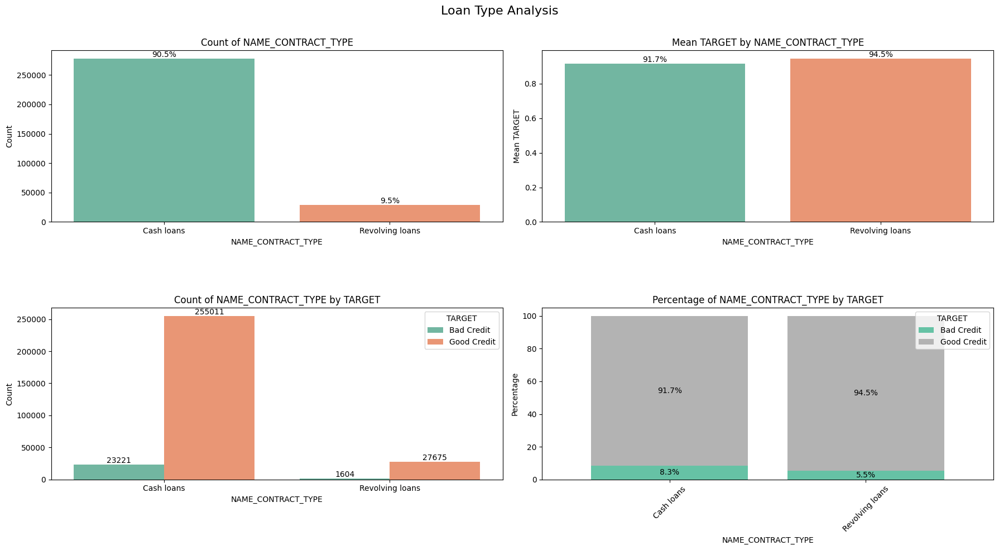

In [ ]:
plot_categorical_var("NAME_CONTRACT_TYPE", data=app_train, title="Loan Type Analysis")

plt.show()


Distribution of Loan Types:

Plot1 shows the count of different loan types, where "cash loans" constitute approximately 90.5% and "revolving loans" make up about 9.5% of the total loans.
Mean Target (Good Credit) by Loan Type:

Plot2 displays the mean percentage of "Good Credit" for each loan type. It indicates that approximately 91.5% of cash loans are associated with good credit, while revolving loans have a higher rate of good credit, at around 94.5%.
Count of Loan Types by Target (Good Credit vs. Bad Credit):

Plot3 is a count plot that shows the distribution of loan types based on the target variable "Good Credit" and "Bad Credit." It illustrates that a significantly higher proportion of cash loans have good credit (more than 90%) compared to bad credit, and similarly, revolving loans also have a higher percentage of good credit borrowers.
Percentage of Loan Types with Good Credit:

Plot4 is a grouped bar plot representing the percentage of loan types with "Good Credit" and "Bad Credit." Both cash loans and revolving loans have more than 90% of their borrowers classified as "Good Credit."


Overall, these insights suggest that both cash loans and revolving loans have a high proportion of borrowers with good credit. It could be valuable information for making business decisions related to loan approval strategies or risk assessment.

**Gender**

In [ ]:
app_train["CODE_GENDER"].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [ ]:
app_train = app_train[app_train['CODE_GENDER'] != 'XNA']

# Verify the updated value counts
print(app_train["CODE_GENDER"].value_counts())

F    202448
M    105059
Name: CODE_GENDER, dtype: int64


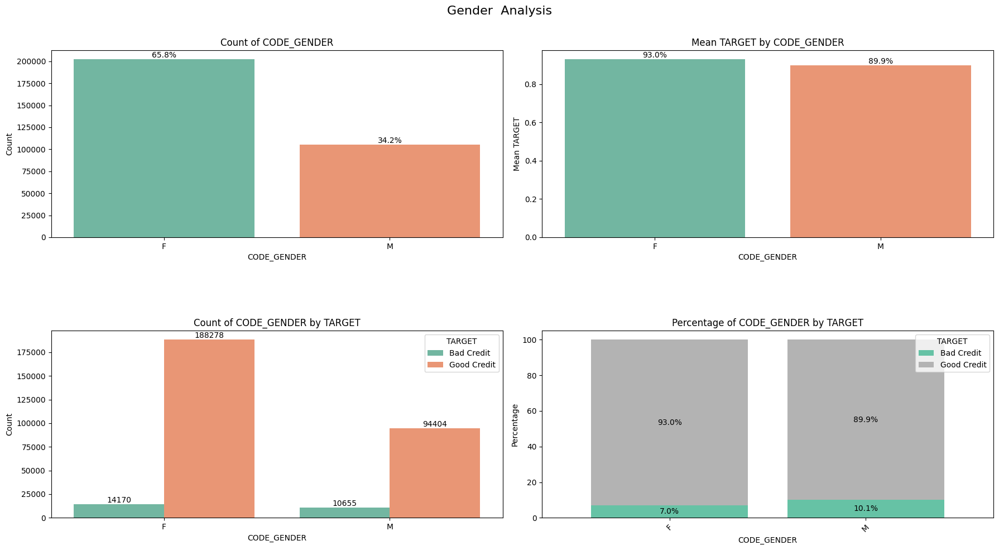

In [ ]:
plot_categorical_var("CODE_GENDER", data=app_train, title="Gender  Analysis")

plt.show()

**Insights:**

In the "Gender Analysis," the majority of applicants are female (65.8%) compared to males (34.2%).

Plot 2 shows that females have a slightly higher mean target (good credit) of 93, while males have a mean target of 89, indicating that females tend to have slightly better credit.

Plot 3 reveals that both females and males have a higher count of good credit (target) compared to bad credit. This suggests that both genders have a higher proportion of applicants with good credit.

Plot 4 illustrates that among females, the percentage of good credit is 93%, while among males, it is 89.9%. This further supports the finding that females have a slightly higher likelihood of having good credit compared to males.

Overall, these insights suggest that females generally have a higher proportion of good credit applicants and a slightly higher mean credit score compared to males in the dataset.

**Client owns a house or flat**

In [ ]:
app_train["FLAG_OWN_REALTY"].value_counts()

Y    213308
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

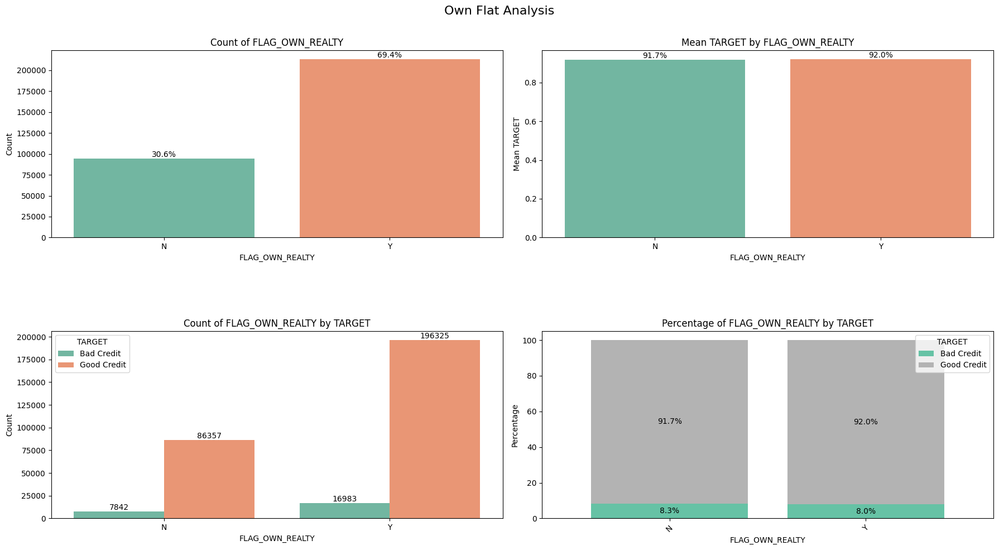

In [ ]:
plot_categorical_var("FLAG_OWN_REALTY", data=app_train, title="Own Flat Analysis")

plt.show()


**Insights:**

In the "Own Flat/No Analysis," the majority of applicants own a flat (69.4%) compared to those who do not (30.6%).

Plot 2 shows that applicants who own a flat have a slightly higher mean target (good credit) of 92%, while those who do not own a flat have a mean target of 91.7%. This suggests that applicants who own a flat tend to have a slightly better credit score.

Plot 3 indicates that both groups, whether they own a flat or not, have a higher count of applicants with good credit compared to bad credit. However, the count of applicants with good credit is significantly higher for those who own a flat (196,325) compared to those who do not (86,357).

Plot 4, we can observe that among applicants with bad credit, 8.3% do not own a flat , while 91.7% of them own a flat. On the other hand, among applicants with good credit, 8.0% do not own a flat, and 92.0% of them own a flat.

Overall, the analysis suggests that owning a flat might be associated with a slightly higher likelihood of having good credit among the applicants in the dataset


**Income Type**

In [ ]:
app_train["NAME_INCOME_TYPE"].value_counts()


Working                 158771
Commercial associate     71616
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

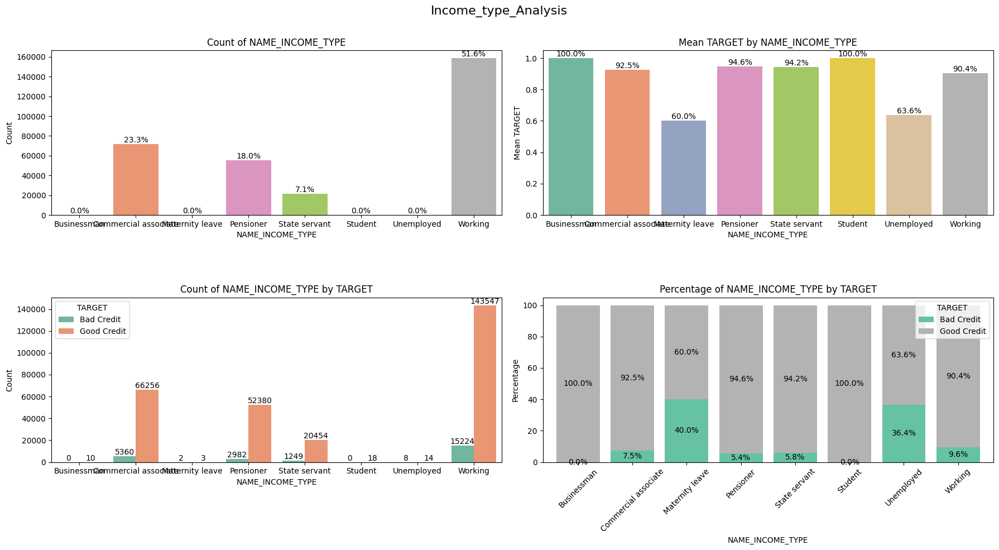

In [ ]:
plot_categorical_var("NAME_INCOME_TYPE", data=app_train, title="Income_type_Analysis")
plt.show()

Income Type Distribution: The "Working" income type is the most common category among applicants, accounting for approximately 51.6% of the total.

Mean Target by Income Type: Applicants categorized as "Student" and "Businessman" have the highest mean target value of 100%, indicating that these groups have a higher proportion of individuals with "Good Credit." On the other hand, the "Working" income type shows a mean target value of approximately 90.4%, suggesting that a slightly lower percentage of individuals in this group have "Good Credit."

Count of Income Type by Target: The "Working" income type exhibits a notable margin between the counts of "Good Credit" and "Bad Credit" instances, implying that a higher proportion of individuals in this group have a good credit rating. However, for some other income types like "Commercial Associate" and "Pensioner," the counts of "Good Credit" and "Bad Credit" instances are more balanced.

Percentage of Good and Bad Credit: Among the "Working" income type, approximately 90.4% of applicants have "Good Credit," while around 9.6% have "Bad Credit." This indicates that the majority of individuals with a "Working" income type are more likely to have a positive credit rating.

**Level of Education**

In [ ]:
app_train["NAME_EDUCATION_TYPE"].value_counts()

Secondary / secondary special    218389
Higher education                  74862
Incomplete higher                 10276
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64

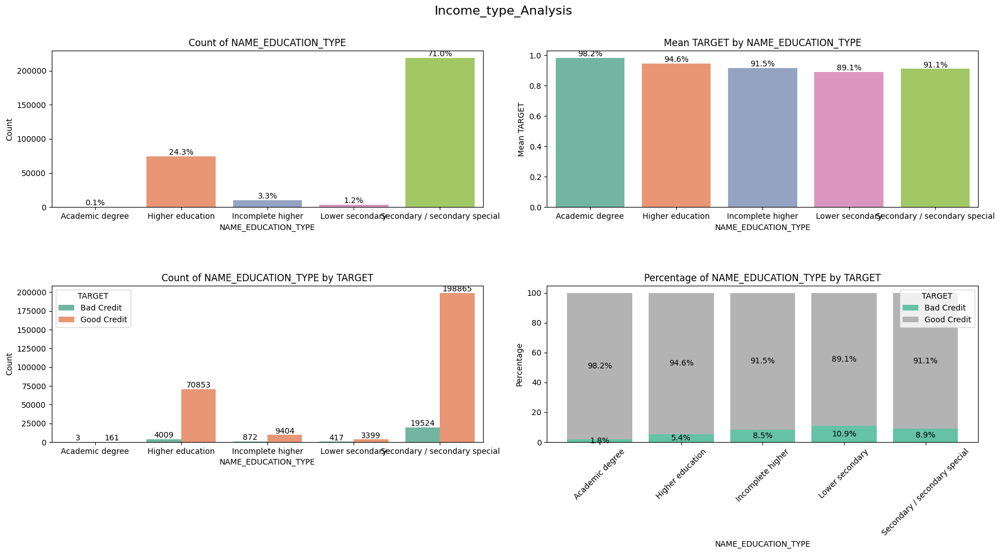

In [ ]:
plot_categorical_var("NAME_EDUCATION_TYPE", data=app_train, title="Income_type_Analysis")
plt.show()

The "Secondary / secondary special" education type has the highest count among applicants, with a total of 218,389 individuals.

 This suggests that the majority of loan applicants have completed secondary education or a similar level of education.

  Overall, it appears that applicants with a secondary level of education are the most common group seeking loans.

**Family Status**

In [ ]:
app_train["NAME_FAMILY_STATUS"].value_counts()

Married                 196429
Single / not married     45444
Civil marriage           29774
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

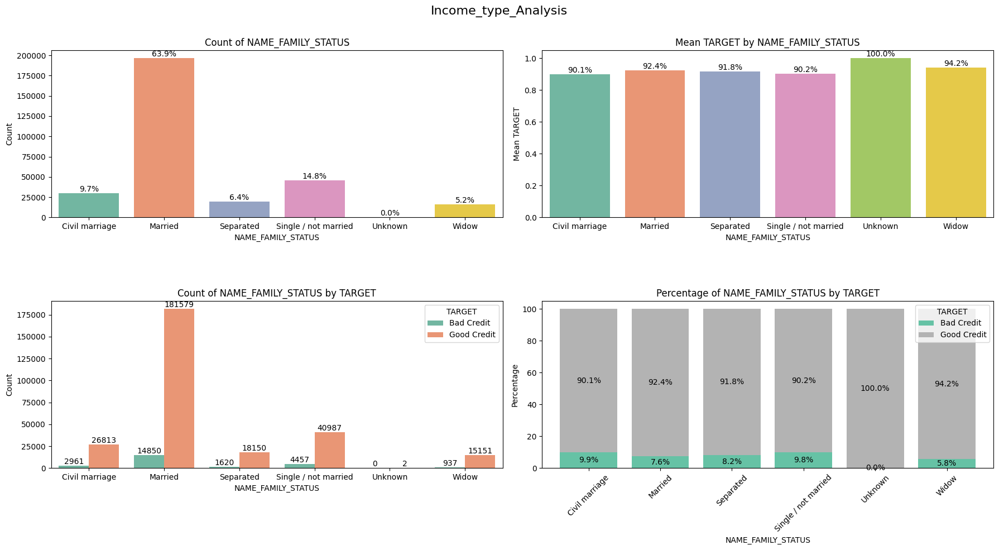

In [ ]:
plot_categorical_var("NAME_FAMILY_STATUS", data=app_train, title="Income_type_Analysis")
plt.show()

The "Married" family status category stands out as the most common among loan applicants in all four plots. This observation suggests that a significant proportion of individuals applying for loans are married. On the other hand, other family status categories, such as "Single/not married," "Civil marriage," "Separated," and "Widow," have notably lower counts compared to the "Married" category.

The dominance of the "Married" category in loan applications might indicate that married individuals are more likely to seek financial assistance, possibly due to shared financial responsibilities or aspirations for various life goals.

**Type of House**

In [ ]:
app_train["NAME_HOUSING_TYPE"].value_counts()

House / apartment      272865
With parents            14840
Municipal apartment     11182
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64

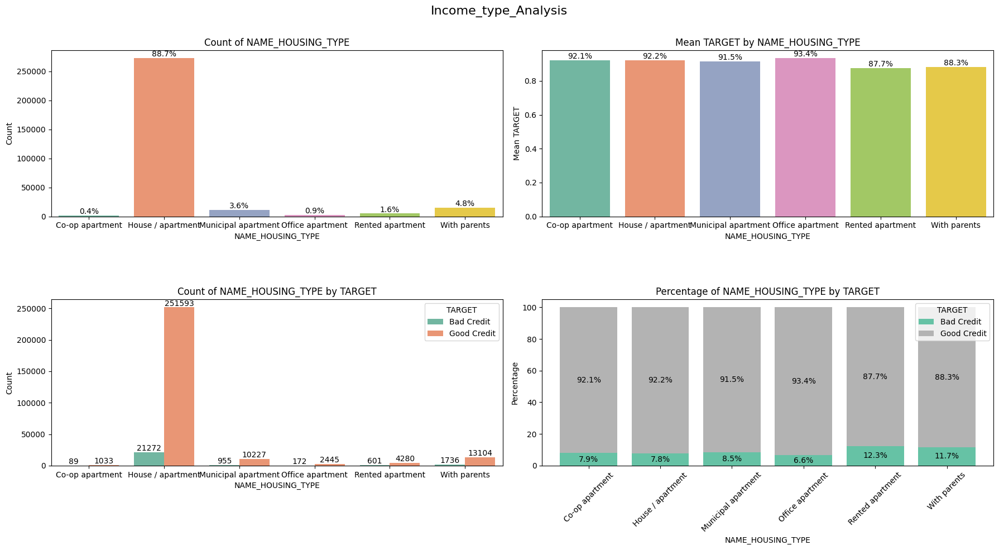

In [ ]:
plot_categorical_var("NAME_HOUSING_TYPE", data=app_train, title="Income_type_Analysis")
plt.show()

The "House/apartment" housing type is the most common among loan applicants in all four plots. This observation indicates that the majority of individuals applying for loans are living in houses or apartments, making it the preferred choice of housing among loan seekers.

This prevalence of "House/apartment" as the dominant housing type in loan applications suggests that individuals with stable accommodation, such as homeowners or apartment dwellers, are more likely to seek financial assistance. This preference for houses or apartments may be due to the perceived stability and long-term nature of such housing options, which aligns with the long-term commitment of taking a loan.

**OCCUPATION_TYPE**

In [ ]:
app_train["OCCUPATION_TYPE"].unique()

array(['Laborers', 'Core staff', 'Accountants', 'Managers', nan,
       'Drivers', 'Sales staff', 'Cleaning staff', 'Cooking staff',
       'Private service staff', 'Medicine staff', 'Security staff',
       'High skill tech staff', 'Waiters/barmen staff',
       'Low-skill Laborers', 'Realty agents', 'Secretaries', 'IT staff',
       'HR staff'], dtype=object)

In [ ]:
app_train["OCCUPATION_TYPE"].value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27569
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2092
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

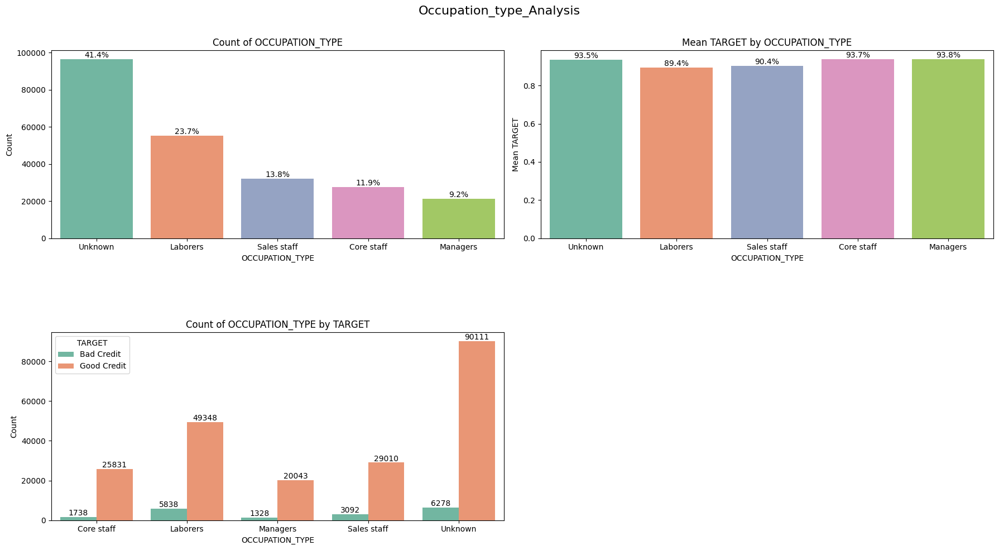

In [ ]:
# Fill missing values with "Unknown"
app_train["OCCUPATION_TYPE"].fillna("Unknown", inplace=True)
app_train["OCCUPATION_TYPE"] = app_train["OCCUPATION_TYPE"].astype(str)

occupation_counts = app_train["OCCUPATION_TYPE"].value_counts()

# Select the top 5 categories
top_5_occupations = occupation_counts.head(5).index

# Filter the data to include only the top 5 categories
app_train_top_occupations = app_train[app_train["OCCUPATION_TYPE"].isin(top_5_occupations)]

# Sort the top 5 categories based on the custom order
sorted_top_5_occupations = sorted(top_5_occupations, key=lambda x: occupation_counts[x], reverse=True)

# Convert the "OCCUPATION_TYPE" column to categorical data type with the sorted custom order
app_train_top_occupations["OCCUPATION_TYPE"] = pd.Categorical(app_train_top_occupations["OCCUPATION_TYPE"], categories=sorted_top_5_occupations, ordered=True)

plot_categorical_var("OCCUPATION_TYPE", data=app_train_top_occupations, title="Occupation_type_Analysis")
plt.show()



Overall, the top 5 profession categories in the dataset include a mix of known and unknown occupations. While laborers form a significant portion of the applicants, individuals from various professions, such as sales staff, core staff, and managers, are also actively seeking loans.

**Most frequent week day**

In [ ]:
app_train["WEEKDAY_APPR_PROCESS_START"].unique()

array(['WEDNESDAY', 'MONDAY', 'THURSDAY', 'SUNDAY', 'SATURDAY', 'FRIDAY',
       'TUESDAY'], dtype=object)

In [ ]:
app_train["WEEKDAY_APPR_PROCESS_START"].value_counts()

TUESDAY      53900
WEDNESDAY    51934
MONDAY       50714
THURSDAY     50590
FRIDAY       50336
SATURDAY     33852
SUNDAY       16181
Name: WEEKDAY_APPR_PROCESS_START, dtype: int64

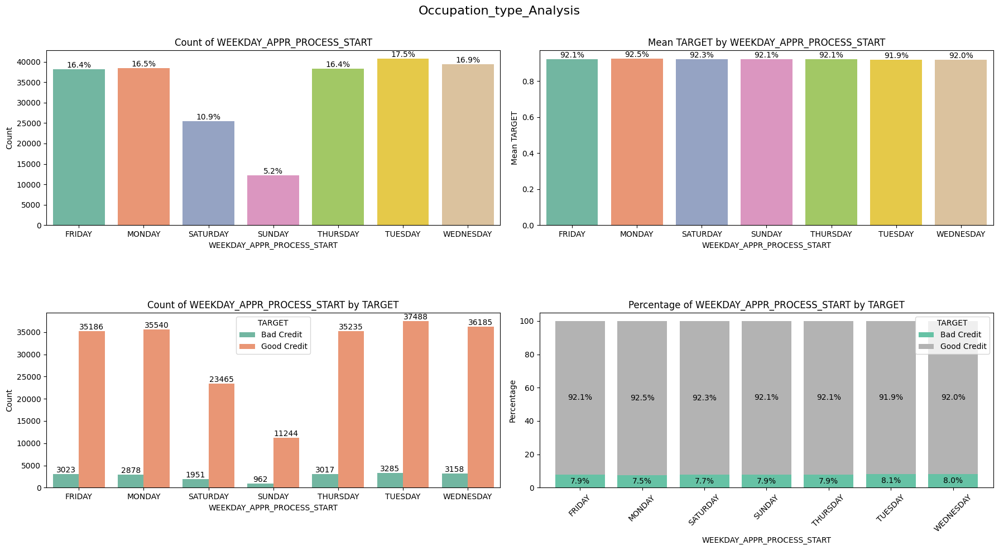

In [ ]:
plot_categorical_var("WEEKDAY_APPR_PROCESS_START", data=app_train_top_occupations, title="Occupation_type_Analysis")
plt.show()


Overall, it appears that there is a slight trend of more loan applications being processed in the middle of the week, possibly indicating that borrowers prefer to apply for loans during weekdays rather than weekends.



**Organization_type**

In [ ]:
app_train["ORGANIZATION_TYPE"].unique()

array(['Business Entity Type 3', 'School', 'Government', 'Religion',
       'Other', 'XNA', 'Electricity', 'Medicine',
       'Business Entity Type 2', 'Self-employed', 'Transport: type 2',
       'Construction', 'Housing', 'Kindergarten', 'Trade: type 7',
       'Industry: type 11', 'Military', 'Services', 'Security Ministries',
       'Transport: type 4', 'Industry: type 1', 'Emergency', 'Security',
       'Trade: type 2', 'University', 'Transport: type 3', 'Police',
       'Business Entity Type 1', 'Postal', 'Industry: type 4',
       'Agriculture', 'Restaurant', 'Culture', 'Hotel',
       'Industry: type 7', 'Trade: type 3', 'Industry: type 3', 'Bank',
       'Industry: type 9', 'Insurance', 'Trade: type 6',
       'Industry: type 2', 'Transport: type 1', 'Industry: type 12',
       'Mobile', 'Trade: type 1', 'Industry: type 5', 'Industry: type 10',
       'Legal Services', 'Advertising', 'Trade: type 5', 'Cleaning',
       'Industry: type 13', 'Trade: type 4', 'Telecom',
       'I

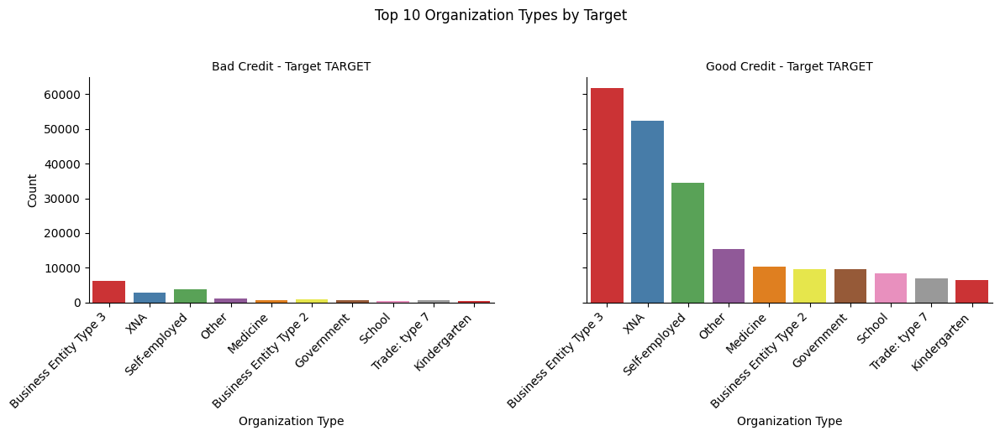

In [ ]:
# Get the top 10 values of "ORGANIZATION_TYPE"
top_10_org_types = app_train["ORGANIZATION_TYPE"].value_counts().head(10).index

app_train_top_org_types = app_train[app_train["ORGANIZATION_TYPE"].isin(top_10_org_types)]

g = sns.FacetGrid(app_train_top_org_types, col="TARGET", height=5, aspect=1.2)
g.map(sns.countplot, "ORGANIZATION_TYPE", palette="Set1", order=top_10_org_types)
g.set_xticklabels(rotation=45, ha="right")  # Rotate x-axis labels


g.set_axis_labels("Organization Type", "Count")
g.set_titles("{col_name} - Target {col_var}")
g.fig.suptitle("Top 10 Organization Types by Target", y=1.03)
plt.tight_layout()
plt.show()


 "Business entity type 3" and "Self-employed" are the two organization types that have a higher proportion of good credit compared to bad credit. This suggests that individuals associated with these organization types are more likely to have a good credit history.

**Checking with No.of kids**

In [ ]:
app_train["CNT_CHILDREN"] = app_train["CNT_CHILDREN"].astype(int)


In [ ]:
unique_values = app_train["CNT_CHILDREN"].unique()
print(unique_values)

[ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]


In [ ]:
app_train["TARGET1"] = app_train["TARGET"].map({'Bad Credit': 0, 'Good Credit': 1})


In [ ]:
app_train["TARGET1"].unique()

array([0, 1])

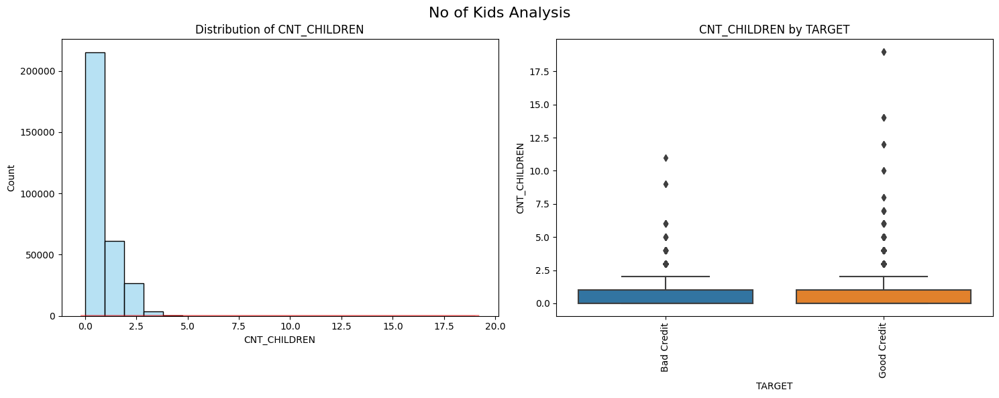

In [ ]:
plot_continuous_var("CNT_CHILDREN", data=app_train, title="No of Kids Analysis")
plt.show()

Most of the clients has either no children, or between 1 and 2.


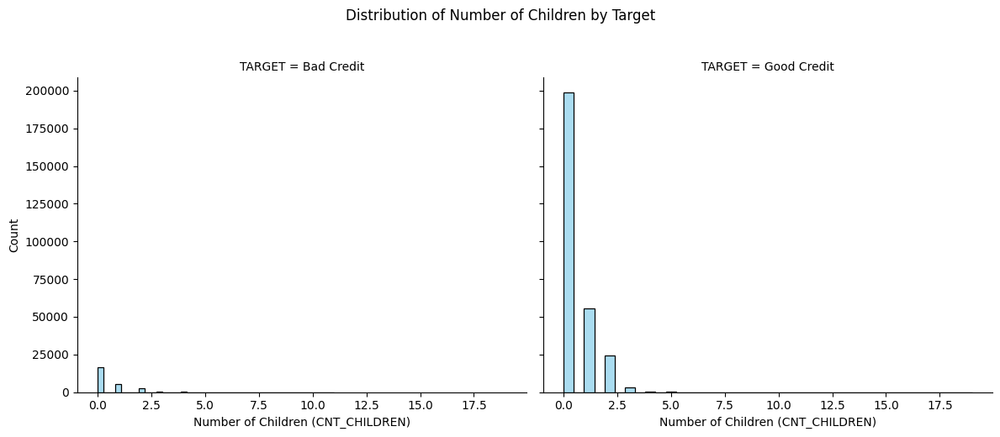

In [ ]:
g = sns.FacetGrid(app_train, col="TARGET", height=5, aspect=1.2)

g.map(sns.histplot, "CNT_CHILDREN", bins=40, kde=False, color="skyblue", alpha=0.7)
g.set_axis_labels("Number of Children (CNT_CHILDREN)", "Count")
g.fig.suptitle("Distribution of Number of Children by Target", y=1.03)

plt.tight_layout()
plt.show()

Most of the clients in both credit groups have either no children or between 1 and 2 children.


There are only a few clients with more than 2 children, indicating that the majority of applicants have fewer dependents.


The distribution of the number of children seems similar between the two credit groups, suggesting that the number of children may not be a significant factor in determining creditworthiness.

**Family Members**

In [ ]:
app_train["CNT_FAM_MEMBERS"].describe()

count   307505.00
mean         2.15
std          0.91
min          1.00
25%          2.00
50%          2.00
75%          3.00
max         20.00
Name: CNT_FAM_MEMBERS, dtype: float64

In [ ]:
app_train["CNT_FAM_MEMBERS"].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  9.,  7.,  8., 10., 13., nan, 14.,
       12., 20., 15., 16., 11.])

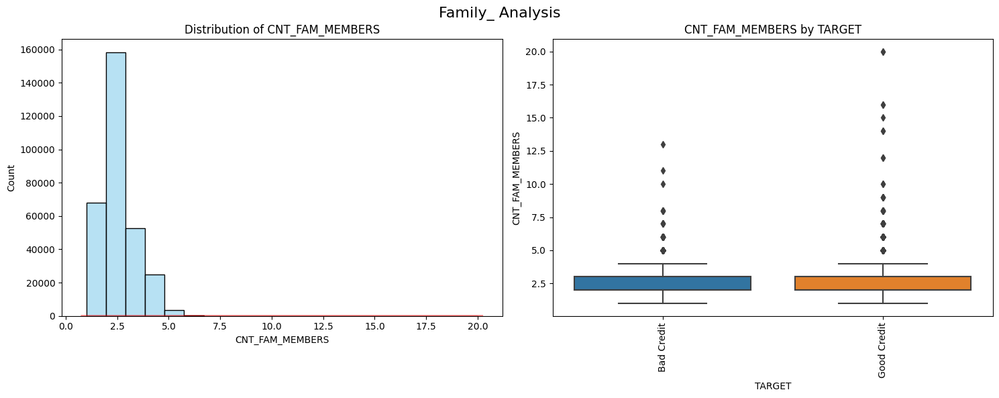

In [ ]:
plot_continuous_var("CNT_FAM_MEMBERS", data=app_train, title="Family_ Analysis")
plt.show()


**Total income**

In [ ]:
app_train["AMT_INCOME_TOTAL"].describe()

count      307507.00
mean       168797.69
std        237124.63
min         25650.00
25%        112500.00
50%        147150.00
75%        202500.00
max     117000000.00
Name: AMT_INCOME_TOTAL, dtype: float64

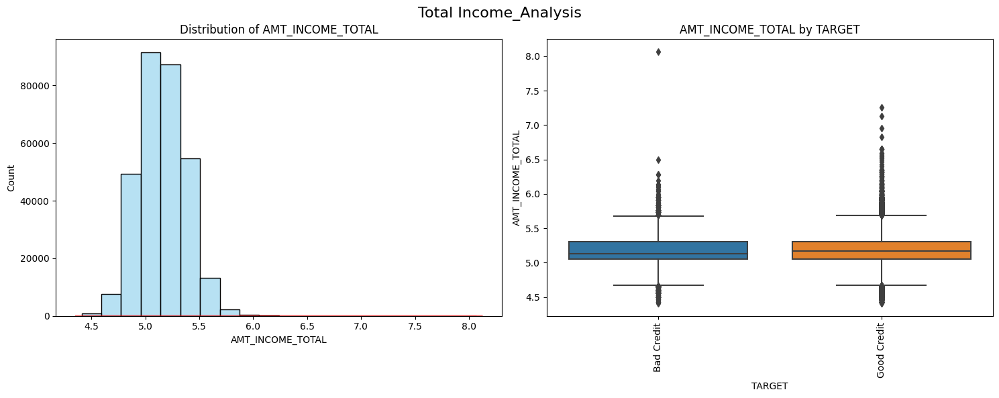

In [ ]:
app_train["AMT_INCOME_TOTAL"]= np.log10(app_train["AMT_INCOME_TOTAL"])
plot_continuous_var("AMT_INCOME_TOTAL", data=app_train, title="Total Income_Analysis")
plt.show()



The log-transformed histogram of total income shows that most clients have incomes between 10,000 and 100,000, peaking around 100,000.

Both bad and good credit clients have similar income distributions, with some outliers in higher income ranges.

 The majority of clients fall within the 10,000 to 30,000 income range. There are a few clients with extremely high incomes in both credit groups.

**Credit amount**

In [ ]:
app_train["AMT_CREDIT"].describe()

count    307507.00
mean     599028.60
std      402492.60
min       45000.00
25%      270000.00
50%      513531.00
75%      808650.00
max     4050000.00
Name: AMT_CREDIT, dtype: float64

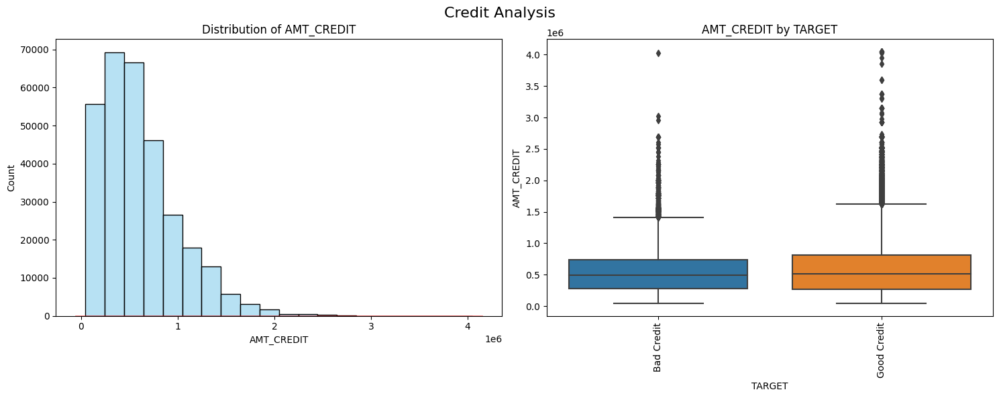

In [ ]:
plot_continuous_var("AMT_CREDIT", data=app_train, title="Credit Analysis")
plt.show()


The above analysis suggests that the majority of loans have lower credit amounts, as indicated by the right-skewed distribution of AMT_CREDIT. The peak of the distribution occurs at a credit amount of 70,000.

When comparing the box plots of credit amounts for bad credit and good credit, we can observe that the interquartile range (IQR) for bad credit ranges from 0.3 to 0.8, while for good credit, it extends from 0.3 to 1. The maximum credit amount for bad credit is around 1.5, whereas for good credit, it is nearly 2. Both distributions also contain outliers, which represent extreme credit amounts.

In conclusion, the analysis highlights that the majority of loans have lower credit amounts, and there is a clear difference in credit amounts between bad and good credit groups. Good credit applicants tend to have higher credit amounts on average compared to those with bad credit.

**The goods for which the loan is given**

In [ ]:
app_train["AMT_GOODS_PRICE"].describe()

count    307229.00
mean     538397.72
std      369447.25
min       40500.00
25%      238500.00
50%      450000.00
75%      679500.00
max     4050000.00
Name: AMT_GOODS_PRICE, dtype: float64

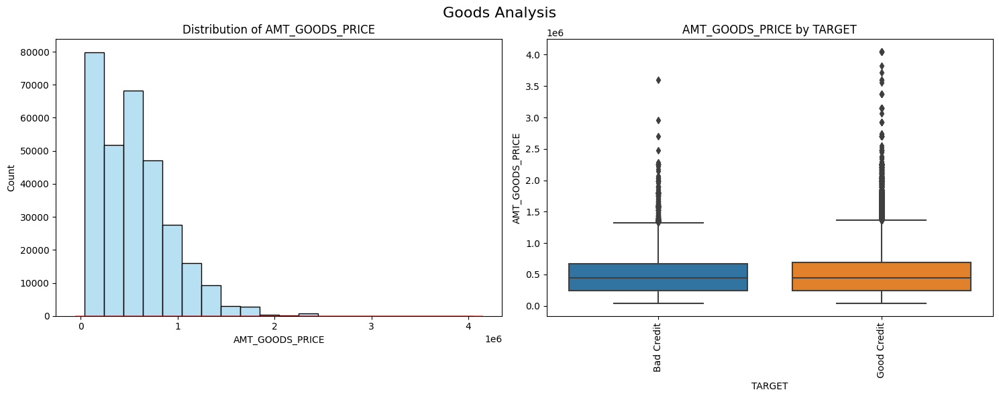

In [ ]:
plot_continuous_var("AMT_GOODS_PRICE", data=app_train, title="Goods Analysis")
plt.show()

Histogram: The distribution of goods prices is right-skewed, with a peak occurring at around 80,000. The majority of goods have lower prices, as indicated by the concentration of data points in the lower range (0 to 0.5). However, the number of goods gradually decreases as the price increases beyond 80,000.

Box Plot: The interquartile range (IQR) for goods price is larger for good credit applicants compared to those with bad credit. This indicates that there is more variability in the goods prices among applicants with good credit. Additionally, the box plot for good credit contains more outliers, suggesting a greater number of extreme values in goods prices among applicants with good credit.

In summary, the analysis shows that the majority of goods have lower prices, but there is a wide range of goods prices among applicants with good credit. Applicants with good credit tend to have more diverse goods prices compared to those with bad credit, as evident from the larger IQR and more outliers in the box plot.

**Age**

In [ ]:
app_train["DAYS_BIRTH"].describe()

count   307507.00
mean    -16037.03
std       4363.98
min     -25229.00
25%     -19682.00
50%     -15750.00
75%     -12413.00
max      -7489.00
Name: DAYS_BIRTH, dtype: float64

In [ ]:
#Calculate the absolute values of the "DAYS_BIRTH" column
app_train["DAYS_BIRTH_ABS"] = abs(app_train["DAYS_BIRTH"])

# Convert days to years
app_train["AGE"] = app_train["DAYS_BIRTH_ABS"] / 365.25

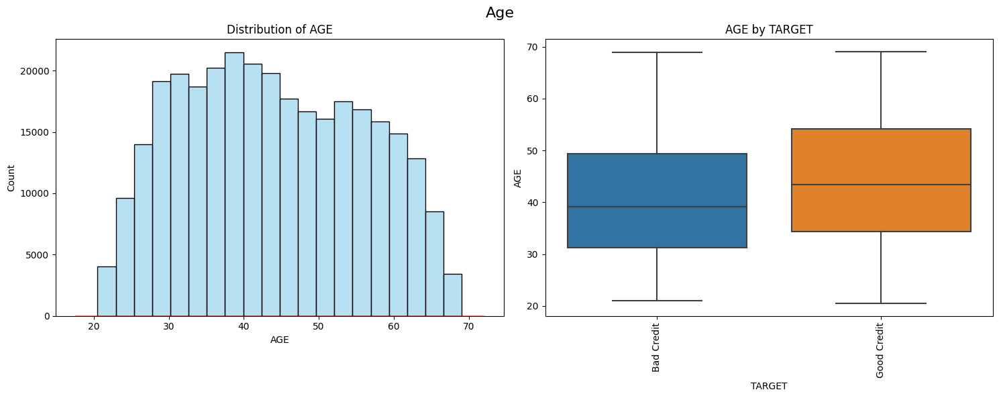

In [ ]:
plot_continuous_var("AGE", data=app_train, title="Age")
plt.show()

The plot for "Age" shows that individuals in the age range of 20 to 50 years are the most common applicants for loans.

 It shows that the median age for both good and bad credit applicants is around 40 to 45 years. However, the interquartile range (IQR) for applicants with good credit is slightly higher, indicating that there is more variation in ages for individuals with good credit.



**Employment years**

In [ ]:
app_train["DAYS_EMPLOYED"].describe()

count   307507.00
mean     63815.93
std     141276.47
min     -17912.00
25%      -2760.00
50%      -1213.00
75%       -289.00
max     365243.00
Name: DAYS_EMPLOYED, dtype: float64

In [ ]:
app_train["DAYS_EMPLOYED"] = abs(app_train["DAYS_EMPLOYED"])

In [ ]:
# Convert the "DAYS_EMPLOYED" column to years
app_train["DAYS_EMPLOYED"] = app_train["DAYS_EMPLOYED"] / 365


In [ ]:
app_train["DAYS_EMPLOYED"].unique()

array([ 1.74520548,  3.25479452,  0.61643836, ..., 35.5369863 ,
       30.36712329, 23.81917808])

In [ ]:
# Remove outliers from "DAYS_EMPLOYED" column
app_train = app_train[app_train["DAYS_EMPLOYED"] < 1000]


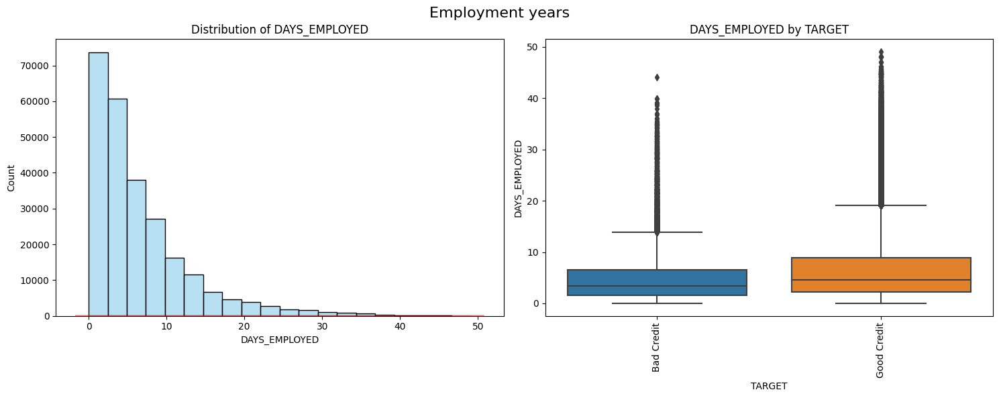

In [ ]:
plot_continuous_var("DAYS_EMPLOYED", data=app_train, title="Employment years")
plt.show()

The "Employment years" analysis reveals an interesting trend. Most loan applicants in the dataset have employment years between 0 and 10. The number of loan applications gradually decreases as the number of employment years increases. This suggests that individuals who are relatively new in their jobs or have been employed for a short duration tend to apply for more loans. As the employment years increase, the demand for loans decreases. This observation could indicate that individuals who have more stable and established employment may have a reduced need for loans compared to those who are still building their careers.

**Having own car**

In [ ]:
app_train["OWN_CAR_AGE"].info()

<class 'pandas.core.series.Series'>
Int64Index: 252133 entries, 0 to 307510
Series name: OWN_CAR_AGE
Non-Null Count  Dtype  
--------------  -----  
94411 non-null  float64
dtypes: float64(1)
memory usage: 3.8 MB


In [ ]:
app_train["OWN_CAR_AGE"].describe()

count   94411.00
mean       11.95
std        11.98
min         0.00
25%         5.00
50%         9.00
75%        15.00
max        91.00
Name: OWN_CAR_AGE, dtype: float64

Most loan applicants who own cars have vehicles that are around 5 years old. As the age of the owned cars increases beyond 5 years, the number of loan applicants gradually decreases.

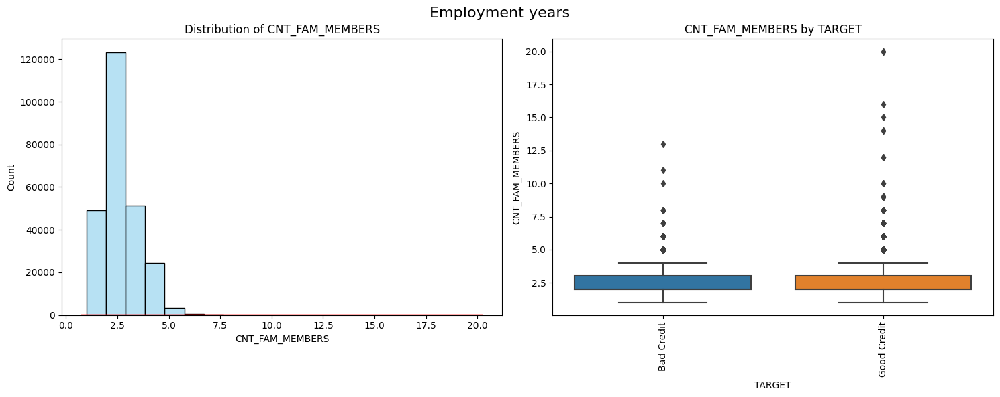

In [ ]:
plot_continuous_var("CNT_FAM_MEMBERS", data=app_train, title="Employment years")
plt.show()

Most loan applicants have either 1, 2, or 3 family members. These values are the most common, and they are represented by the peaks in the histogram.

As the number of family members increases beyond 3, the count of loan applicants gradually decreases. This indicates that smaller families (with 1, 2, or 3 members) are more common among loan applicants than larger families.

The most frequent number of family members is 2, followed closely by 1 and 3. This suggests that single individuals, couples, and small families are the majority of loan applicants.

There are very few loan applicants with family sizes greater than 3, as evidenced by the decreasing count in the histogram for values beyond 3.

Overall, the plot indicates that smaller families are more common among loan applicants, and there are fewer loan applicants with larger family sizes.

**Region rating and city**

In [ ]:
app_train["REGION_RATING_CLIENT"].unique()

array([2, 1, 3])

In [ ]:
app_train["REGION_RATING_CLIENT_W_CITY"].unique()

array([2, 1, 3])

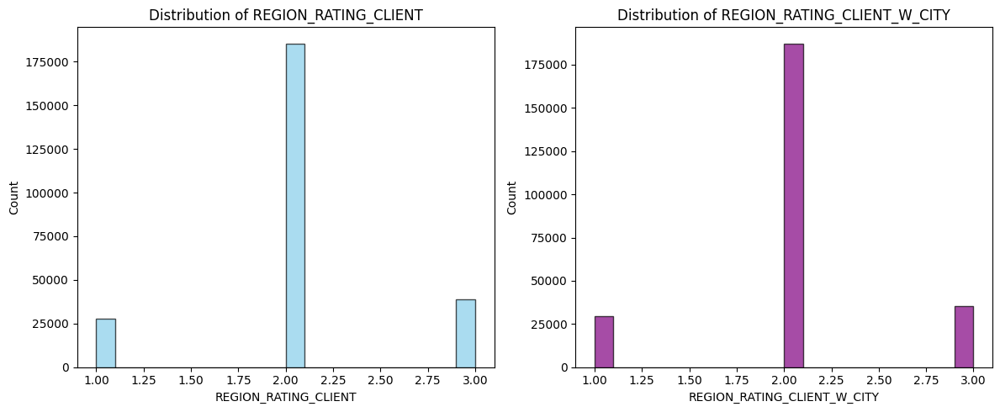

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].hist(app_train["REGION_RATING_CLIENT"], bins=20, color='skyblue', edgecolor='black', alpha=0.7)
axes[0].set_xlabel("REGION_RATING_CLIENT")
axes[0].set_ylabel("Count")
axes[0].set_title("Distribution of REGION_RATING_CLIENT")

# Plot histogram for "REGION_RATING_CLIENT_W_CITY"
axes[1].hist(app_train["REGION_RATING_CLIENT_W_CITY"], bins=20, color='purple', edgecolor='black', alpha=0.7)
axes[1].set_xlabel("REGION_RATING_CLIENT_W_CITY")
axes[1].set_ylabel("Count")
axes[1].set_title("Distribution of REGION_RATING_CLIENT_W_CITY")

plt.tight_layout()
plt.show()

In [ ]:
correlation = app_train["REGION_RATING_CLIENT"].corr(app_train["REGION_RATING_CLIENT_W_CITY"])
print("Correlation coefficient:", correlation)

Correlation coefficient: 0.9503176544028771


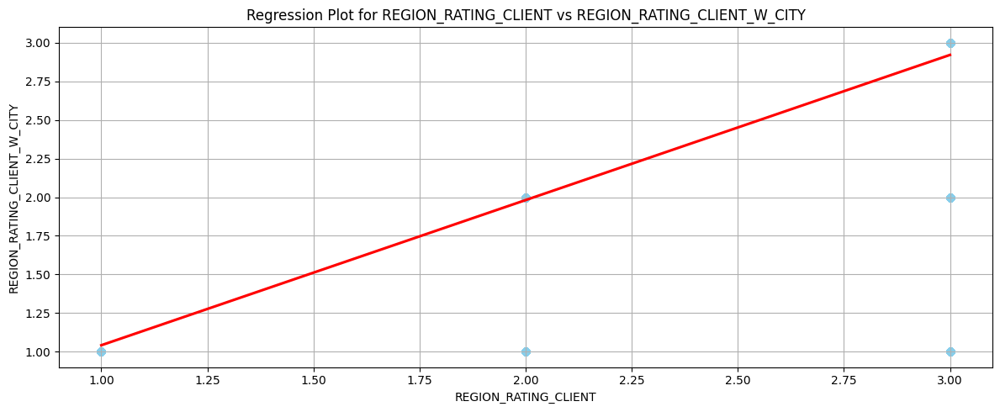

In [ ]:
plt.figure(figsize=(12, 5))
sns.regplot(x="REGION_RATING_CLIENT", y="REGION_RATING_CLIENT_W_CITY", data=app_train, scatter_kws={"color": "skyblue", "alpha": 0.5}, line_kws={"color": "red"})

plt.xlabel("REGION_RATING_CLIENT")
plt.ylabel("REGION_RATING_CLIENT_W_CITY")
plt.title("Regression Plot for REGION_RATING_CLIENT vs REGION_RATING_CLIENT_W_CITY")

plt.grid(True)
plt.tight_layout()
plt.show()

The high correlation coefficient of 0.950 indicates a strong positive linear relationship between "REGION_RATING_CLIENT" and "REGION_RATING_CLIENT_W_CITY." Both of these variables being mostly rated as 2 could indicate that they are related to loans in a similar manner or share similar criteria for evaluation in a particular region.

**Documents provided**

In [ ]:
document_columns = [
    "FLAG_DOCUMENT_2",
    "FLAG_DOCUMENT_3",
    "FLAG_DOCUMENT_4",
    "FLAG_DOCUMENT_5",
    "FLAG_DOCUMENT_6",
    "FLAG_DOCUMENT_7",
    "FLAG_DOCUMENT_8",
    "FLAG_DOCUMENT_9",
    "FLAG_DOCUMENT_10",
    "FLAG_DOCUMENT_11",
    "FLAG_DOCUMENT_12",
    "FLAG_DOCUMENT_13",
    "FLAG_DOCUMENT_14",
    "FLAG_DOCUMENT_15",
    "FLAG_DOCUMENT_16",
    "FLAG_DOCUMENT_17",
    "FLAG_DOCUMENT_18",
    "FLAG_DOCUMENT_19",
    "FLAG_DOCUMENT_20",
    "FLAG_DOCUMENT_21"
]

# Get value counts for each column
document_counts = app_train[document_columns].sum()

print(document_counts)

FLAG_DOCUMENT_2         13
FLAG_DOCUMENT_3     192347
FLAG_DOCUMENT_4         20
FLAG_DOCUMENT_5       4098
FLAG_DOCUMENT_6       2186
FLAG_DOCUMENT_7         52
FLAG_DOCUMENT_8      24461
FLAG_DOCUMENT_9       1158
FLAG_DOCUMENT_10         6
FLAG_DOCUMENT_11      1203
FLAG_DOCUMENT_12         2
FLAG_DOCUMENT_13      1070
FLAG_DOCUMENT_14       891
FLAG_DOCUMENT_15       364
FLAG_DOCUMENT_16      3007
FLAG_DOCUMENT_17        81
FLAG_DOCUMENT_18      2480
FLAG_DOCUMENT_19       179
FLAG_DOCUMENT_20       155
FLAG_DOCUMENT_21       103
dtype: int64


In [ ]:
app_train['FLAG_DOCUMENT_6'].unique()

array([0, 1])

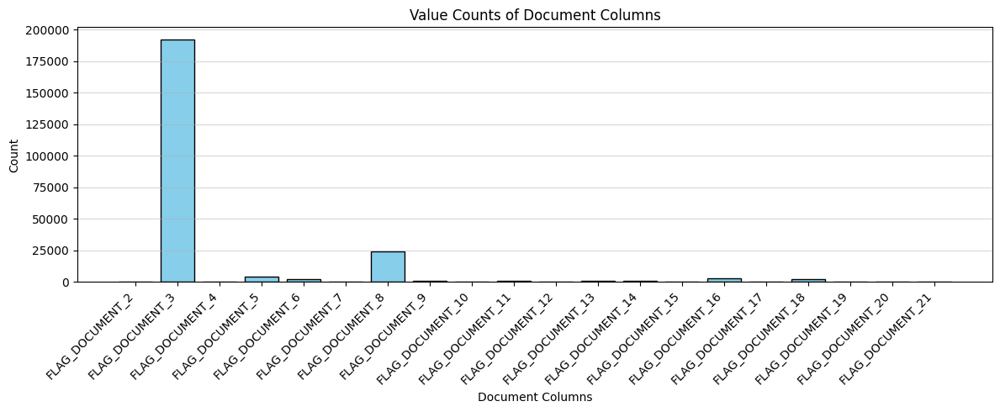

In [ ]:
plt.figure(figsize=(12, 5))
plt.bar(document_counts.index, document_counts.values, color='skyblue', edgecolor='black')
plt.xlabel("Document Columns")
plt.ylabel("Count")
plt.title("Value Counts of Document Columns")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.5)
plt.tight_layout()
plt.show()

In [ ]:
# Calculate the value counts of each document column in app_test
document_counts_train = app_train[document_columns].sum()
document_counts_test = app_test[document_columns].sum()

threshold = 1000

filtered_document_columns_train = document_counts_train[document_counts_train <= threshold].index
filtered_document_columns_test = document_counts_test[document_counts_test <= threshold].index

app_train.drop(columns=filtered_document_columns_train, inplace=True)
app_test.drop(columns=filtered_document_columns_test, inplace=True)

F`iltered out document-related columns that had less than 1000 non-zero values in both the training and testing datasets. This means that these columns contained documents that were rarely or infrequently provided by the applicants. By removing such columns, we prioritize the more common and relevant documents, which could be of greater significance in predicting the target variable or understanding the overall patterns in the data. This simplification of the feature set allows for a more focused and efficient analysis while still retaining the most informative features for the task at hand.

**Geographical mobility**

In [ ]:
"REG_REGION_NOT_LIVE_REGION",
"REG_REGION_NOT_WORK_REGION",
"LIVE_REGION_NOT_WORK_REGION",

('LIVE_REGION_NOT_WORK_REGION',)

These flags provide insights into the geographical mobility and regional disparities between the client's permanent address, current living address, and current work address.

In [ ]:
columns_to_check = [
    "REG_REGION_NOT_LIVE_REGION",
    "REG_REGION_NOT_WORK_REGION",
    "LIVE_REGION_NOT_WORK_REGION"
]

value_counts = app_train[columns_to_check].apply(pd.Series.value_counts)

styled_value_counts = value_counts.style.background_gradient(cmap='Blues')

display(styled_value_counts)

,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION
0,247786,236521,239630
1,4347,15612,12503


"REG_REGION_NOT_LIVE_REGION": Most of the applicants (approximately 98.3%) belong to a region where they live.
"REG_REGION_NOT_WORK_REGION": The majority of applicants (around 92.6%) work in the region where they live.
"LIVE_REGION_NOT_WORK_REGION": The majority of applicants (around 95.1%) live in a region different from where they work.

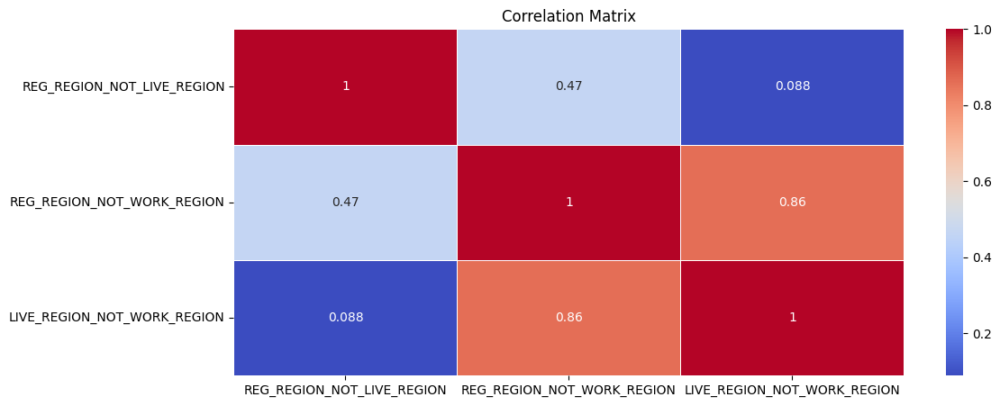

In [ ]:
data = {
    "REG_REGION_NOT_LIVE_REGION": app_train["REG_REGION_NOT_LIVE_REGION"],
    "REG_REGION_NOT_WORK_REGION": app_train["REG_REGION_NOT_WORK_REGION"],
    "LIVE_REGION_NOT_WORK_REGION": app_train["LIVE_REGION_NOT_WORK_REGION"]
}
df = pd.DataFrame(data)

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(12, 5))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()



The correlation matrix shows low to moderate positive correlations between the three address-related columns. The strongest correlation is between "REG_REGION_NOT_WORK_REGION" and "LIVE_REGION_NOT_WORK_REGION" with a value of 0.86.

In [ ]:
# Create the 'ADDRESS_MISMATCH' column
app_train['ADDRESS_MISMATCH'] = ((app_train['REG_REGION_NOT_LIVE_REGION'] == 1) |
                                 (app_train['REG_REGION_NOT_WORK_REGION'] == 1) |
                                 (app_train['LIVE_REGION_NOT_WORK_REGION'] == 1)).astype(int)

# Remove the original columns
app_train.drop(columns=['REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION'],
               inplace=True)

In [ ]:
app_test['ADDRESS_MISMATCH'] = ((app_test['REG_REGION_NOT_LIVE_REGION'] == 1) |
                                (app_test['REG_REGION_NOT_WORK_REGION'] == 1) |
                                (app_test['LIVE_REGION_NOT_WORK_REGION'] == 1)).astype(int)

app_test.drop(columns=['REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION'],
              inplace=True)

**External source Indicators**

In [ ]:
"EXT_SOURCE_1",
"EXT_SOURCE_2",
"EXT_SOURCE_3"

'EXT_SOURCE_3'

In [ ]:
app_train["EXT_SOURCE_1"].unique()

array([0.08303697, 0.31126731,        nan, ..., 0.14557045, 0.7440264 ,
       0.73445967])

In [ ]:
# Calculate the average of "EXT_SOURCE_1", "EXT_SOURCE_2", and "EXT_SOURCE_3" across app_train and app_test
app_train["EXT_SOURCE_AVG"] = app_train[["EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3"]].mean(axis=1)
app_test["EXT_SOURCE_AVG"] = app_test[["EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3"]].mean(axis=1)

# Remove the original "EXT_SOURCE_1", "EXT_SOURCE_2", and "EXT_SOURCE_3" columns
app_train.drop(columns=["EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3"], inplace=True)
app_test.drop(columns=["EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3"], inplace=True)


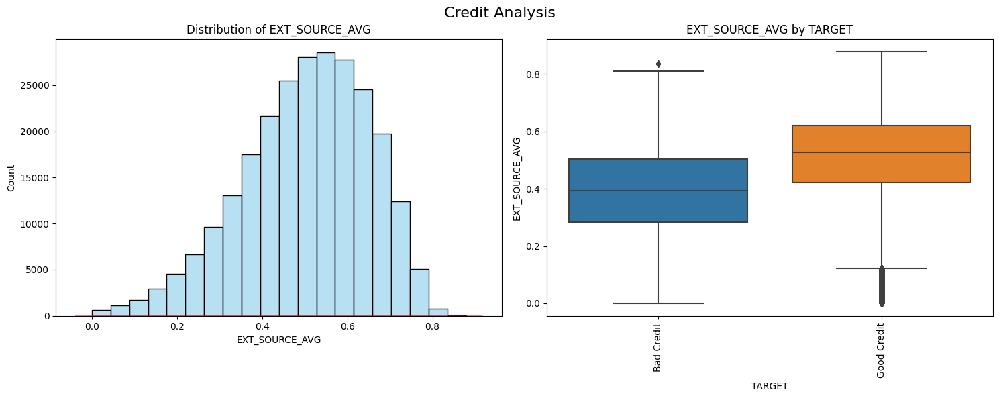

In [ ]:
plot_continuous_var("EXT_SOURCE_AVG", data=app_train, title="Credit Analysis")
plt.show()

Applicants with higher values of "EXT_SOURCE_AVG" are more likely to have good credit, while those with lower values are more likely to have bad credit. The distribution is left-skewed, with a peak around 0.0 to 0.5.

**Social connections and interactions**

In [ ]:
"OBS_30_CNT_SOCIAL_CIRCLE",
"DEF_30_CNT_SOCIAL_CIRCLE",
"OBS_60_CNT_SOCIAL_CIRCLE",
"DEF_60_CNT_SOCIAL_CIRCLE"

'DEF_60_CNT_SOCIAL_CIRCLE'

In [ ]:
columns_to_remove = ["OBS_30_CNT_SOCIAL_CIRCLE", "DEF_30_CNT_SOCIAL_CIRCLE"]


app_train.drop(columns=columns_to_remove, inplace=True)
app_test.drop(columns=columns_to_remove, inplace=True)


Removed number of observations of client's social surroundings in the last 30 days. because we have long term 60 days

In [ ]:
app_train["DEF_60_CNT_SOCIAL_CIRCLE"].info()

<class 'pandas.core.series.Series'>
Int64Index: 252133 entries, 0 to 307510
Series name: DEF_60_CNT_SOCIAL_CIRCLE
Non-Null Count   Dtype  
--------------   -----  
251284 non-null  float64
dtypes: float64(1)
memory usage: 3.8 MB


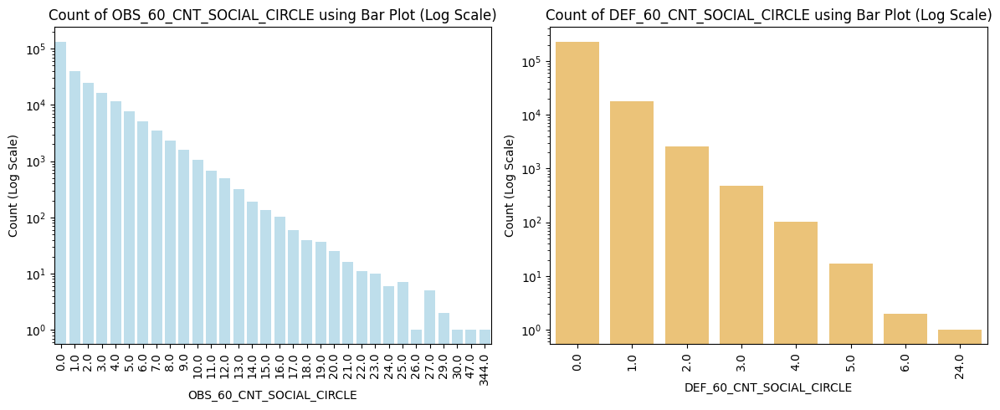

In [ ]:
obs_value_counts = app_train["OBS_60_CNT_SOCIAL_CIRCLE"].value_counts()
def_value_counts = app_train["DEF_60_CNT_SOCIAL_CIRCLE"].value_counts()

plt.figure(figsize=(12, 5))

# Plot for OBS_60_CNT_SOCIAL_CIRCLE
plt.subplot(1, 2, 1)
sns.barplot(x=obs_value_counts.index, y=obs_value_counts, color='skyblue', alpha=0.6)
plt.yscale('log')
plt.xlabel("OBS_60_CNT_SOCIAL_CIRCLE")
plt.ylabel("Count (Log Scale)")
plt.title("Count of OBS_60_CNT_SOCIAL_CIRCLE using Bar Plot (Log Scale)")
plt.xticks(rotation=90)

# Plot for DEF_60_CNT_SOCIAL_CIRCLE
plt.subplot(1, 2, 2)
sns.barplot(x=def_value_counts.index, y=def_value_counts, color='orange', alpha=0.6)
plt.yscale('log')
plt.xlabel("DEF_60_CNT_SOCIAL_CIRCLE")
plt.ylabel("Count (Log Scale)")
plt.title("Count of DEF_60_CNT_SOCIAL_CIRCLE using Bar Plot (Log Scale)")
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


Higher counts in "OBS_60_CNT_SOCIAL_CIRCLE" might suggest a strong social network, potentially viewed positively by lenders. Conversely, higher counts in "DEF_60_CNT_SOCIAL_CIRCLE" could raise concerns about default risk. Further analysis is needed for definitive conclusions.

**Keeping average**

In [ ]:
# Columns to remove from app_train and app_test
columns_to_remove = [
    "APARTMENTS_MODE",
    "BASEMENTAREA_MODE",
    "YEARS_BEGINEXPLUATATION_MODE",
    "YEARS_BUILD_MODE",
    "COMMONAREA_MODE",
    "ELEVATORS_MODE",
    "ENTRANCES_MODE",
    "FLOORSMAX_MODE",
    "FLOORSMIN_MODE",
    "LANDAREA_MODE",
    "LIVINGAPARTMENTS_MODE",
    "LIVINGAREA_MODE",
    "NONLIVINGAPARTMENTS_MODE",
    "NONLIVINGAREA_MODE",
    "APARTMENTS_MEDI",
    "BASEMENTAREA_MEDI",
    "YEARS_BEGINEXPLUATATION_MEDI",
    "YEARS_BUILD_MEDI",
    "COMMONAREA_MEDI",
    "ELEVATORS_MEDI",
    "ENTRANCES_MEDI",
    "FLOORSMAX_MEDI",
    "FLOORSMIN_MEDI",
    "LANDAREA_MEDI",
    "LIVINGAPARTMENTS_MEDI",
    "LIVINGAREA_MEDI",
    "NONLIVINGAPARTMENTS_MEDI",
    "NONLIVINGAREA_MEDI",
    "FONDKAPREMONT_MODE",
    "HOUSETYPE_MODE",
    "TOTALAREA_MODE",
    "WALLSMATERIAL_MODE",
    "EMERGENCYSTATE_MODE",
    'REG_CITY_NOT_LIVE_CITY',
    'REG_CITY_NOT_WORK_CITY',
    'LIVE_CITY_NOT_WORK_CITY',
    'REGION_RATING_CLIENT_W_CITY'

]

# Remove the specified columns from app_train
app_train.drop(columns=columns_to_remove, inplace=True)

# Remove the specified columns from app_test
app_test.drop(columns=columns_to_remove, inplace=True)


After analyzing the data, it was found that taking the average values for the specified columns is sufficient for our analysis. Therefore, we removed the 'MODE' and 'MEDI' columns to streamline the data and simplify the dataset.

In [ ]:
# Columns to remove from app_train
columns_to_remove = [
    'DAYS_BIRTH_ABS',
    'TARGET1',
    'FLAG_DOCUMENT_18',
    'FLAG_DOCUMENT_9',
    'FLAG_DOCUMENT_5',
    'FLAG_DOCUMENT_13',
    'FLAG_DOCUMENT_16',
    'FLAG_DOCUMENT_11'
]

# Remove the specified columns from app_train
app_train.drop(columns=columns_to_remove, inplace=True)


After analyzing the data, we decided to remove the following columns from both the training and test datasets: 'DAYS_BIRTH_ABS', 'TARGET1', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_16', and 'FLAG_DOCUMENT_11'. The 'AGE' and 'TARGET' columns were retained for further analysis.")


**Preprocessing**

In [ ]:
#Calculate the absolute values of the "DAYS_BIRTH" column
app_test["DAYS_BIRTH_ABS"] = abs(app_test["DAYS_BIRTH"])

# Convert days to years
app_test["AGE"] = app_test["DAYS_BIRTH_ABS"] / 365.25

In [ ]:
# Drop the 'DAYS_BIRTH' and 'DAYS_BIRTH_ABS' columns as they are no longer needed
app_test.drop(columns=['DAYS_BIRTH', 'DAYS_BIRTH_ABS'], inplace=True)


In [ ]:
app_train.drop(columns=['DAYS_BIRTH'], inplace=True)

In [ ]:
# Convert 'DAYS_EMPLOYED' to years in app_train
app_train['YEARS_EMPLOYED'] = app_train['DAYS_EMPLOYED'].abs() / 365
app_train['YEARS_EMPLOYED'].replace({np.inf: np.nan}, inplace=True)

# Convert 'DAYS_EMPLOYED' to years in app_test
app_test['YEARS_EMPLOYED'] = app_test['DAYS_EMPLOYED'].abs() / 365
app_test['YEARS_EMPLOYED'].replace({np.inf: np.nan}, inplace=True)


In [ ]:
# Drop the original 'DAYS_EMPLOYED' column as it is no longer needed
app_train.drop(columns=['DAYS_EMPLOYED'], inplace=True)
app_test.drop(columns=['DAYS_EMPLOYED'], inplace=True)

In [ ]:
app_train['YEARS_EMPLOYED'].unique()

array([0.00478138, 0.00891725, 0.00168887, ..., 0.09736161, 0.0831976 ,
       0.06525802])

In [ ]:
# app_train.drop(columns=["SK_ID_CURR"],inplace=True)


In [ ]:
# Replace 'Bad Credit' with 0 and 'Good Credit' with 1
app_train["TARGET"].replace({'Bad Credit': 0, 'Good Credit': 1}, inplace=True)


In [ ]:
train_columns = set(app_train.columns)
test_columns = set(app_test.columns)

common_columns = train_columns.intersection(test_columns)
unique_train_columns = train_columns.difference(test_columns)
unique_test_columns = test_columns.difference(train_columns)

print("Common Columns:", common_columns)
print("Columns unique to Train:", unique_train_columns)
print("Columns unique to Test:", unique_test_columns)







Common Columns: {'OCCUPATION_TYPE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'LIVINGAREA_AVG', 'AMT_REQ_CREDIT_BUREAU_DAY', 'LIVINGAPARTMENTS_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'FLAG_CONT_MOBILE', 'FLAG_DOCUMENT_3', 'HOUR_APPR_PROCESS_START', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_GOODS_PRICE', 'YEARS_EMPLOYED', 'NAME_FAMILY_STATUS', 'DAYS_ID_PUBLISH', 'FLAG_WORK_PHONE', 'NAME_TYPE_SUITE', 'REGION_RATING_CLIENT', 'CODE_GENDER', 'APARTMENTS_AVG', 'LANDAREA_AVG', 'AGE', 'FLAG_DOCUMENT_8', 'BASEMENTAREA_AVG', 'AMT_REQ_CREDIT_BUREAU_QRT', 'DAYS_LAST_PHONE_CHANGE', 'WEEKDAY_APPR_PROCESS_START', 'YEARS_BUILD_AVG', 'ENTRANCES_AVG', 'ORGANIZATION_TYPE', 'FLAG_OWN_REALTY', 'FLAG_DOCUMENT_6', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_ANNUITY', 'FLOORSMAX_AVG', 'DAYS_REGISTRATION', 'FLAG_EMAIL', 'REGION_POPULATION_RELATIVE', 'EXT_SOURCE_AVG', 'FLOORSMIN_AVG', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'NONLIVINGAPARTMENTS_AVG', 'NAME_INCOME_TYPE', 'FLAG_MOBIL', 'CNT_FAM_MEMBERS', 'AMT_INCOME_TOTAL', 'F

**Correlation**

In [ ]:
plot_correlation_heatmap(app_train)


Clients with higher credit amounts and annuities are slightly more likely to have payment difficulties.

Clients with higher average external scores and longer employment histories are less likely to have payment difficulties.

Clients with more children or family members are slightly less likely to face payment difficulties.

Clients with higher incomes and larger credit amounts are slightly more likely to face payment difficulties.

Various property-related features are positively correlated with each other, representing different aspects of the property's characteristics.

Clients in regions with higher ratings are slightly less likely to have payment difficulties.

Younger clients are more likely to face payment difficulties, while those with longer employment histories are less likely to have payment difficulties.


**Statastical testing**

Null Hypothesis (H0):
The correlation coefficient is not significantly different from zero (i.e., there is no linear relationship between the two variables).

Alternative Hypothesis (H1):
The correlation coefficient is significantly different from zero (i.e., there is a linear relationship between the two variables).

In [ ]:
correlation_matrix = app_train.corr()

# Create an empty dictionary to store the absolute correlations
abs_correlations = {}

# Loop through each column in the DataFrame
for column1 in correlation_matrix.columns:
    for column2 in correlation_matrix.columns:
        if column1 != column2 and column1 in app_train.columns and column2 in app_train.columns:
            # Drop rows with missing values for the current pair of columns
            valid_data = app_train[[column1, column2]].dropna()

            try:
                # Calculate the correlation coefficient and store its absolute value
                correlation_coefficient, p_value = stats.pearsonr(valid_data[column1], valid_data[column2])
                abs_correlations[(column1, column2)] = {
                    'correlation': correlation_coefficient,
                    'p_value': p_value,
                    'count': len(valid_data)
                }
            except:
                # Handle the case where correlation cannot be calculated
                abs_correlations[(column1, column2)] = {
                    'correlation': 0,
                    'p_value': 1,
                    'count': 0
                }

# Sort the correlations based on their absolute values and get the top 5
top_5_correlations = sorted(abs_correlations.items(), key=lambda x: abs(x[1]['correlation']), reverse=True)[:5]

print("\nTop 5 Correlations:")
for (columns, data) in top_5_correlations:
    print(f"Correlation between {columns[0]} and {columns[1]}: {data['correlation']:.2f}, p-value: {data['p_value']:.4f}, Count: {data['count']}")



Top 5 Correlations:
Correlation between AMT_CREDIT and AMT_GOODS_PRICE: 0.99, p-value: 0.0000, Count: 251877
Correlation between AMT_GOODS_PRICE and AMT_CREDIT: 0.99, p-value: 0.0000, Count: 251877
Correlation between LIVINGAREA_AVG and APARTMENTS_AVG: 0.91, p-value: 0.0000, Count: 121376
Correlation between CNT_CHILDREN and CNT_FAM_MEMBERS: 0.89, p-value: 0.0000, Count: 252131
Correlation between ELEVATORS_AVG and LIVINGAREA_AVG: 0.87, p-value: 0.0000, Count: 115887


The p-value for all these correlations is extremely low (p-value: 0.0000), indicating that the correlations are statistically significant. Therefore, we reject the null hypothesis and conclude that there is a significant linear relationship between the variables in each pair.

**Analysing (previous_app.csv)**


In [ ]:
previous_app.sample(4)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
557238,2297909,419397,Consumer loans,10853.42,98766.00,98766.00,0.00,98766.00,MONDAY,12,Y,1,0.00,NaN,NaN,XAP,Refused,-413,Cash through the bank,HC,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,10.00,low_normal,POS mobile without interest,NaN,NaN,NaN,NaN,NaN,NaN
741843,2226826,388348,Consumer loans,29744.78,265050.00,253764.00,26505.00,265050.00,TUESDAY,15,Y,1,0.10,NaN,NaN,XAP,Approved,-1089,Cash through the bank,XAP,Unaccompanied,Repeater,Furniture,POS,XNA,Stone,99,Industry,10.00,middle,POS industry with interest,365243.00,-1057.00,-787.00,-937.00,-930.00,0.00
879561,1946339,229129,Consumer loans,15440.53,129015.00,140368.50,0.00,129015.00,THURSDAY,11,Y,1,0.00,NaN,NaN,XAP,Approved,-230,Cash through the bank,XAP,Unaccompanied,Repeater,Consumer Electronics,POS,XNA,Stone,-1,Consumer electronics,10.00,low_normal,POS household with interest,365243.00,-199.00,71.00,365243.00,365243.00,0.00
846838,1483185,179151,Cash loans,26316.00,900000.00,900000.00,NaN,900000.00,TUESDAY,17,Y,1,NaN,NaN,NaN,XNA,Refused,-756,Cash through the bank,LIMIT,"Spouse, partner",Repeater,XNA,Cash,walk-in,AP+ (Cash loan),4,XNA,60.00,low_normal,Cash Street: low,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Group by SK_ID_CURR and NAME_CONTRACT_STATUS and count occurrences
df_app = previous_app.groupby(["SK_ID_CURR", "NAME_CONTRACT_STATUS"])["NAME_CONTRACT_TYPE"].count().reset_index(name="count")


In [ ]:
df_app.head()

,SK_ID_CURR,NAME_CONTRACT_STATUS,count
0,100001,Approved,1
1,100002,Approved,1
2,100003,Approved,3
3,100004,Approved,1
4,100005,Approved,1


In [ ]:
# Pivot the table to reshape the data
prev_status = pd.pivot_table(df_app, values="count", index="SK_ID_CURR", columns="NAME_CONTRACT_STATUS", fill_value=0).reset_index()



In [ ]:
prev_status.head()

NAME_CONTRACT_STATUS,SK_ID_CURR,Approved,Canceled,Refused,Unused offer
0,100001,1,0,0,0
1,100002,1,0,0,0
2,100003,3,0,0,0
3,100004,1,0,0,0
4,100005,1,1,0,0


In [ ]:
prev_status.rename(
    columns={
        "Approved": "PREV_APPROVED",
        "Canceled": "PREV_CANCELED",
        "Refused": "PREV_REFUSED",
    },
    inplace=True,
)

In [ ]:
prev_status.sample(6)

NAME_CONTRACT_STATUS,SK_ID_CURR,PREV_APPROVED,PREV_CANCELED,PREV_REFUSED,Unused offer
189635,299457,1,0,0,1
125034,231451,3,0,0,0
278067,391959,2,0,0,0
28768,130194,4,2,1,0
262041,375610,4,3,4,0
36276,138071,5,0,0,0


In [ ]:
prev_status = prev_status.drop(columns=["Unused offer"])


 **Analysing (POS_CASH_balance.csv)**



In [ ]:
pos_cash_bal.sample(5)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
793017,2049578,421605,-5,25.00,0.00,Completed,0,0
6880523,1368976,183154,-39,12.00,11.00,Active,0,0
7240672,2693640,275406,-6,6.00,1.00,Active,0,0
9946280,2323020,237377,-71,36.00,16.00,Active,0,0
3211350,1329670,189503,-80,12.00,9.00,Active,0,0


In [ ]:
installment = (
    pos_cash_bal.groupby("SK_ID_CURR")["CNT_INSTALMENT_FUTURE"]
    .sum()
    .reset_index(name='installment_remaining')
)

In [ ]:
installment.head()

,SK_ID_CURR,installment_remaining
0,100001,13.00
1,100002,285.00
2,100003,162.00
3,100004,9.00
4,100005,72.00


**Analysing(credit_card_balance.csv)**

In [ ]:
credit_card_bal.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.97,135000,0.00,877.50,0.00,877.50,1700.33,1800.00,1800.00,0.00,0.00,0.00,0.00,1,0.00,1.00,35.00,Active,0,0
1,2582071,363914,-1,63975.56,45000,2250.00,2250.00,0.00,0.00,2250.00,2250.00,2250.00,60175.08,64875.56,64875.56,1.00,1,0.00,0.00,69.00,Active,0,0
2,1740877,371185,-7,31815.22,450000,0.00,0.00,0.00,0.00,2250.00,2250.00,2250.00,26926.42,31460.08,31460.08,0.00,0,0.00,0.00,30.00,Active,0,0
3,1389973,337855,-4,236572.11,225000,2250.00,2250.00,0.00,0.00,11795.76,11925.00,11925.00,224949.29,233048.97,233048.97,1.00,1,0.00,0.00,10.00,Active,0,0
4,1891521,126868,-1,453919.46,450000,0.00,11547.00,0.00,11547.00,22924.89,27000.00,27000.00,443044.40,453919.46,453919.46,0.00,1,0.00,1.00,101.00,Active,0,0


In [ ]:
# Selecting the desired columns from credit_card_bal DataFrame
selected_columns = [
    "SK_ID_CURR",
    "AMT_BALANCE",
    "AMT_CREDIT_LIMIT_ACTUAL",
    "AMT_DRAWINGS_ATM_CURRENT",
    "AMT_DRAWINGS_CURRENT",
    "AMT_DRAWINGS_OTHER_CURRENT",
    "AMT_DRAWINGS_POS_CURRENT",
    "AMT_INST_MIN_REGULARITY",
    "AMT_PAYMENT_CURRENT",
    "AMT_PAYMENT_TOTAL_CURRENT",
    "AMT_RECEIVABLE_PRINCIPAL",
    "AMT_RECIVABLE",
    "AMT_TOTAL_RECEIVABLE",
]
credit_card = credit_card_bal[selected_columns]



In [ ]:
# Grouping and calculating the mean for each column by SK_ID_CURR
credit_card_grouped = credit_card.groupby("SK_ID_CURR").mean().reset_index()

# Filling any missing values with 0
credit_card_grouped = credit_card_grouped.fillna(0)


In [ ]:
credit_card_grouped.head()


,SK_ID_CURR,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE
0,100006,0.00,270000.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,100011,54482.11,164189.19,2432.43,2432.43,0.00,0.00,3956.22,4843.06,4520.07,52402.09,54433.18,54433.18
2,100013,18159.92,131718.75,6350.00,5953.12,0.00,0.00,1454.54,7168.35,6817.17,17255.56,18101.08,18101.08
3,100021,0.00,675000.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,100023,0.00,135000.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


**Modelling**

In [ ]:
app_train.head(1)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,ORGANIZATION_TYPE,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_8,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,ADDRESS_MISMATCH,EXT_SOURCE_AVG,YEARS_EMPLOYED
0,100002,0,Cash loans,M,N,Y,0,5.31,406597.50,24700.50,351000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-3648.00,-2120,NaN,1,1,0,1,1,0,Laborers,1.00,2,WEDNESDAY,10,Business Entity Type 3,0.02,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,2.00,2.00,-1134.00,1,0,0,0.00,0.00,0.00,0.00,0.00,1.00,25.90,0,0.16,0.00


In [ ]:
X = app_train.drop(["TARGET", "SK_ID_CURR"], axis=1)
y = app_train['TARGET']



In [ ]:
class_counts = y.value_counts()

# Calculate the class distribution
class_distribution = class_counts / len(y) * 100

print("Class Distribution:")
print(class_distribution)

Class Distribution:
1   91.34
0    8.66
Name: TARGET, dtype: float64


In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)


In [ ]:
# Check the class distribution in the training set
print("Training Set Class Distribution:")
print(y_train.value_counts(normalize=True))

# Check the class distribution in the testing set
print("\nTesting Set Class Distribution:")
print(y_test.value_counts(normalize=True))

Training Set Class Distribution:
1   0.91
0   0.09
Name: TARGET, dtype: float64

Testing Set Class Distribution:
1   0.91
0   0.09
Name: TARGET, dtype: float64


In [ ]:
cat_features = []
num_features = []
for column in X.columns:
    col_type = X[column].dtype
    if col_type == "object" or col_type.name == "category":
        cat_features.append(column)
    else:
        num_features.append(column)

In [ ]:
cat_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent", missing_values=np.nan)),
        ("ordinal", OrdinalEncoder()),
    ]
)
num_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="constant")),
        ("scaler", StandardScaler()),
    ]
)

preprocessor = ColumnTransformer(
    transformers=[
        ("cat", cat_transformer, cat_features),
        ("num", num_transformer, num_features),
    ]
)

In [ ]:
# Create pipelines for each model
logreg_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', LogisticRegression(max_iter=1000,class_weight='balanced'))
])

rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', RandomForestClassifier())
])


xgb_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', XGBClassifier(scale_pos_weight=np.sum(y_train == 0) / np.sum(y_train == 1)))
])


lgbm_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', LGBMClassifier(is_unbalance=True))
])



In [ ]:
def evaluate_models(models, X_train, y_train, X_test, y_test):
    results = []
    metrics = {'Accuracy': accuracy_score, 'Roc_auc': roc_auc_score, 'F1-score': f1_score,
               'Precision': precision_score, 'Recall': recall_score}

    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        metrics_values = []
        for metric_name, metric_func in metrics.items():
            metric_value = metric_func(y_test, y_pred)
            metrics_values.append(metric_value)

        results.append([model_name] + metrics_values)

    result_df = pd.DataFrame(results, columns=['Classifier', 'Accuracy', 'Roc_auc', 'F1-score', 'Precision', 'Recall'])

    # Apply styling to the DataFrame
    styled_df = result_df.style.highlight_max(color='lightgreen', axis=0).highlight_min(color='lightcoral', axis=0)

    # Display the styled DataFrame
    display(styled_df)



In [ ]:
models = {
    'Logistic Regression': logreg_pipeline,
    'Random Forest': rf_pipeline,
    'XGBoost': xgb_pipeline,
    'LightGBM': lgbm_pipeline
}
evaluate_models(models, X_train, y_train, X_test, y_test)


,Classifier,Accuracy,Roc_auc,F1-score,Precision,Recall
0,Logistic Regression,0.684118,0.676910,0.798594,0.956129,0.685627
1,Random Forest,0.913499,0.501194,0.954784,0.913589,0.999870
2,XGBoost,0.721141,0.679973,0.827010,0.954156,0.729766
3,LightGBM,0.695580,0.687641,0.807102,0.958056,0.697243



Here are the insights from the classifier evaluation:

Logistic Regression: Achieved moderate accuracy and well-balanced precision and recall scores. However, the ROC AUC score suggests that it may not be the best model for distinguishing between classes.

Random Forest: Demonstrated high accuracy but relatively low ROC AUC score. This could indicate an issue in class separation, as suggested by the low ROC AUC value.

XGBoost: Achieved decent accuracy and reasonable precision and recall scores. The ROC AUC score is moderately good, indicating a balanced performance in predicting both classes.

LightGBM: Yielded moderate accuracy and balanced precision and recall. The ROC AUC score suggests a solid ability to discriminate between classes.

In summary, while Random Forest's accuracy is high, its ROC AUC score suggests it might struggle with class separation. XGBoost and LightGBM appear to strike a better balance between accuracy and class distinction.







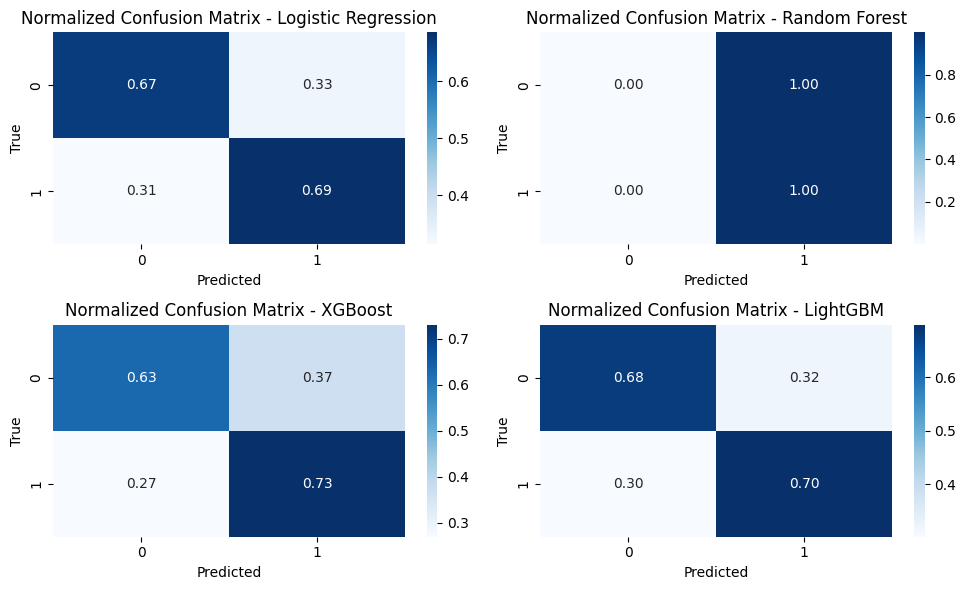

In [ ]:
def plot_cm(models, X_train, y_train):
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 6))
    axes = axes.flatten()

    for ax, (model_name, model) in zip(axes, models.items()):
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        cm = confusion_matrix(y_test, y_pred, normalize='true')
        sns.heatmap(cm, annot=True, cmap='Blues', fmt='.2f', ax=ax)
        ax.set_title(f'Normalized Confusion Matrix - {model_name}')
        ax.set_xlabel('Predicted')
        ax.set_ylabel('True')

    plt.tight_layout()
    plt.show()

# Call the plot_cm function
plot_cm(models, X_train, y_train)


Logistic Regression:

True Positive Rate (Recall): 68.56%
True Negative Rate: 66.82%
False Positive Rate: 33.18%
False Negative Rate: 31.44%

Random Forest:

True Positive Rate (Recall): 99.81%
True Negative Rate: 0.12%
False Positive Rate: 99.88%
False Negative Rate: 0.02%

XGBoost:

True Positive Rate (Recall): 72.98%
True Negative Rate: 63.02%
False Positive Rate: 36.98%
False Negative Rate: 27.02%

LightGBM:

True Positive Rate (Recall): 69.72%
True Negative Rate: 67.80%
False Positive Rate: 32.20%
False Negative Rate: 30.28%



**Hyperparameters**

In [ ]:
pip install optuna


In [ ]:
def objective_xgb(trial, X, y, preprocessor):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 50, 300, step=50),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.1, log=True),
    }

    # Create pipeline
    xgb_pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('model', XGBClassifier(**params))
    ])

    # Evaluate the pipeline using cross-validation
    scores = cross_val_score(xgb_pipeline, X, y, cv=3, scoring='roc_auc')
    return scores.mean()

# Rest of your code...




In [ ]:
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import train_test_split, cross_val_score


sampler = TPESampler(seed=42)
hp_xgb = optuna.create_study(direction="maximize", sampler=sampler)
hp_xgb.optimize(
    lambda trial: objective_xgb(trial, X_train, y_train, preprocessor),
    n_trials=10,
    show_progress_bar=True,
)

[I 2023-08-08 17:02:26,478] A new study created in memory with name: no-name-1e4b0bd6-779a-4e38-b8d5-fde558f4d15c


  0%|          | 0/10 [00:00<?, ?it/s]

[I 2023-08-08 17:12:34,995] Trial 0 finished with value: 0.7404878860602694 and parameters: {'n_estimators': 150, 'max_depth': 10, 'learning_rate': 0.029106359131330698}. Best is trial 0 with value: 0.7404878860602694.
[I 2023-08-08 17:16:29,485] Trial 1 finished with value: 0.7229192228203867 and parameters: {'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.002051110418843397}. Best is trial 0 with value: 0.7404878860602694.
[I 2023-08-08 17:19:23,010] Trial 2 finished with value: 0.7299705785253116 and parameters: {'n_estimators': 50, 'max_depth': 9, 'learning_rate': 0.015930522616241012}. Best is trial 0 with value: 0.7404878860602694.
[I 2023-08-08 17:22:57,791] Trial 3 finished with value: 0.7480463080139459 and parameters: {'n_estimators': 250, 'max_depth': 3, 'learning_rate': 0.08706020878304858}. Best is trial 3 with value: 0.7480463080139459.
[I 2023-08-08 17:27:49,763] Trial 4 finished with value: 0.7236097934769861 and parameters: {'n_estimators': 250, 'max_depth': 4,

In [ ]:
print("Best F1-score on validation set:", str(round(hp_xgb.best_value, 3)))

Best F1-score on validation set: 0.748


In [ ]:
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier

# Assuming you have `hp_xgb` containing the best parameters study object from Optuna

# Extract the best parameters from the study object
xgb_best_params = hp_xgb.best_params

# Create the XGBoost model with the best parameters
xgb_model = XGBClassifier(
    objective="binary:logistic",  # or "reg:logistic" for regression tasks
    use_label_encoder=False,       # To avoid warnings
    **xgb_best_params,             # Pass the best parameters
    seed=48,
)

# Create the pipeline including the preprocessor and the XGBoost model
xgb_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', xgb_model)
])

# Fit the pipeline on the training data
xgb_pipeline.fit(X_train, y_train)




Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ordinal',
                                                                   OrdinalEncoder())]),
                                                  ['NAME_CONTRACT_TYPE',
                                                   'CODE_GENDER',
                                                   'FLAG_OWN_CAR',
                                                   'FLAG_OWN_REALTY',
                                                   'NAME_TYPE_SUITE',
                                                   'NAME_INCOME_TYPE',
                                                   'NAME_EDUCATION_TYPE',
                                                   'NAME_FAMILY_STATUS',
                                                   'NAME_HOUSING_TYPE',
                                                   'OCCUPATION...
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.08706020878304858, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max_delta_step=None, max_depth=3,
                               max_leaves=None, min_child_weight=None,
                               missing=nan, monotone_constraints=None,
                               n_estimators=250, n_jobs=None,
                               num_parallel_tree=None, predictor=None,
                               random_state=None, ...))])

In [ ]:
# Predict using the trained XGBoost pipeline
y_pred = xgb_pipeline.predict(X_test)
y_prob = xgb_pipeline.predict_proba(X_test)

print("Predicted Labels:", y_pred)
print("Predicted Probabilities:", y_prob)

Predicted Labels: [1 1 1 ... 1 1 1]
Predicted Probabilities: [[0.04557776 0.95442224]
 [0.02667153 0.9733285 ]
 [0.04293942 0.9570606 ]
 ...
 [0.02515429 0.9748457 ]
 [0.17907661 0.8209234 ]
 [0.35074103 0.649259  ]]


 In the first instance, the model predicts a positive class (1) with a probability of approximately 95.44% and a negative class (0) with a probability of approximately 4.56%. These probabilities reflect the model's confidence in its predictions.







In [ ]:
class_report = classification_report(y_test, y_pred, target_names=["Class 0", "Class 1"])

print(class_report)

              precision    recall  f1-score   support

     Class 0       0.59      0.01      0.01      4367
     Class 1       0.91      1.00      0.95     46060

    accuracy                           0.91     50427
   macro avg       0.75      0.50      0.48     50427
weighted avg       0.89      0.91      0.87     50427



Precision and Recall Imbalance: The model's precision for Class 0 is low (0.59), indicating that it struggles to correctly identify instances of this class. Conversely, the recall for Class 1 is high (0.91), showing the model's ability to effectively capture instances of Class 1.

F1-Score and Support: The F1-score for Class 1 is high (0.95), reflecting a balance between precision and recall. However, the F1-score for Class 0 is notably low (0.01), indicating that the model struggles to find a balance for this class. The support values represent the number of instances in each class.

Accuracy: The overall accuracy of the model is relatively high (0.91). However, this metric can be misleading due to the class imbalance, as the model predominantly predicts Class 1.

Macro and Weighted Averages: The macro average F1-score and precision (0.48 and 0.75, respectively) provide an overview of the model's performance across both classes. The weighted average F1-score (0.87) takes class imbalance into account.

In summary, the model excels in predicting Class 1 instances but struggles with Class 0. Addressing the class imbalance and fine-tuning the model could potentially improve its performance on both classes.







**Best Model**

In [ ]:
import joblib
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report
from xgboost import XGBClassifier

# Create a pipeline with preprocessor and XGBoost classifier
xgb_model = Pipeline([
    ('preprocessor', preprocessor),  # Use the preprocessor you defined
    ('model', XGBClassifier(scale_pos_weight=np.sum(y_train == 0) / np.sum(y_train == 1)))
])

xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)

# Generate the classification report
report = classification_report(y_test, y_pred)

print(report)




              precision    recall  f1-score   support

           0       0.18      0.63      0.28      4367
           1       0.95      0.73      0.83     46060

    accuracy                           0.72     50427
   macro avg       0.57      0.68      0.55     50427
weighted avg       0.89      0.72      0.78     50427



The classification model's performance on a binary task is as follows:

The model shows low precision (0.18) for class "0", indicating that when it predicts "0", it's often incorrect.

It demonstrates high precision (0.95) for class "1", suggesting that its positive predictions for "1" are usually correct.

The model's recall for class "0" is 0.63, indicating it can identify a reasonable portion of actual "0" instances.

Its recall for class "1" is 0.73, showing it can capture a good number of "1" instances.

The F1-score for class "0" is 0.28, while for class "1" it's 0.83. This highlights a trade-off between precision and recall.

The overall accuracy achieved is 0.72, showcasing the proportion of correct predictions.

In terms of the macro average, the model's performance is moderate, with values of 0.57 (precision), 0.68 (recall), and 0.55 (F1-score).
Weighted average considers class imbalance and provides balanced insights. The model's weighted average values are 0.89 (precision), 0.72 (recall), and 0.78 (F1-score).

In conclusion, the model demonstrates a trade-off between precision and recall. While it performs well in predicting class "1", it struggles with class "0", as indicated by the low precision. Further adjustments could enhance its balance between these metrics.

**Feature Importance**

In [ ]:
importance_scores = xgb_model.named_steps['model'].feature_importances_
feature_names = X.columns

# Create a dictionary to store feature importance scores
feature_importance = dict(zip(feature_names, importance_scores))

# Sort the features by importance in descending order
sorted_features = sorted(feature_importance.items(), key=lambda x: x[1], reverse=True)

top_n = 10
for feature, importance in sorted_features[:top_n]:
    print(f"{feature}: {importance}")


EXT_SOURCE_AVG: 0.11933863162994385
AMT_CREDIT: 0.04737536981701851
CODE_GENDER: 0.03823186457157135
FLAG_OWN_CAR: 0.03580569475889206
NAME_CONTRACT_TYPE: 0.03551952913403511
FLAG_DOCUMENT_3: 0.03382841870188713
DEF_60_CNT_SOCIAL_CIRCLE: 0.02351788990199566
HOUR_APPR_PROCESS_START: 0.0226286668330431
DAYS_ID_PUBLISH: 0.021701494231820107
REGION_POPULATION_RELATIVE: 0.019765391945838928


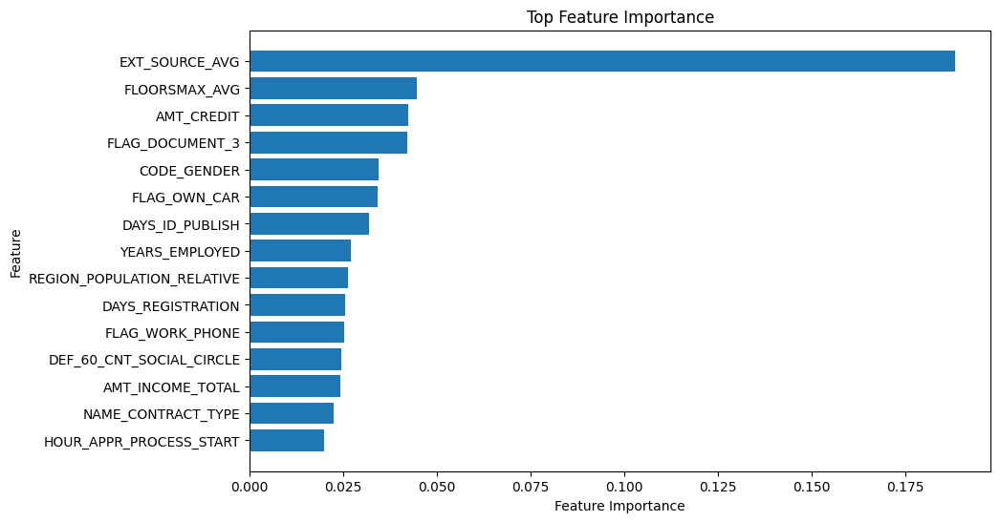

In [ ]:
top_n = 15  # Choose the number of top features you want to display
top_features = [feature[0] for feature in sorted_features[:top_n]]
top_importances = [feature[1] for feature in sorted_features[:top_n]]

plt.figure(figsize=(10, 6))
plt.barh(top_features, top_importances)
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Top Feature Importance')
plt.gca().invert_yaxis()
plt.show()

We can see that EXT_SOURCE_AVG has highest feature importance

In [ ]:
# Save the classification report to a file
with open('xgb_classification_report.txt', 'w') as f:
    f.write(report)

# Save the trained model
joblib.dump(xgb_model, 'xgb_model.pkl')

['xgb_model.pkl']

**Additional data (bureau.csv)**

In [ ]:
bureau_df.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.00,-153.00,NaN,0,91323.00,0.00,NaN,0.00,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.00,NaN,NaN,0,225000.00,171342.00,NaN,0.00,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.00,NaN,NaN,0,464323.50,NaN,NaN,0.00,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.00,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.00,NaN,77674.50,0,2700000.00,NaN,NaN,0.00,Consumer credit,-21,NaN


In [ ]:
active_counts = pd.pivot_table(
    bureau_df[bureau_df["CREDIT_ACTIVE"] == "Active"],
    index="SK_ID_CURR",
    columns="CREDIT_ACTIVE",
    values="CREDIT_CURRENCY",
    aggfunc="count",
    fill_value=0
)

In [ ]:
active_counts = active_counts.reset_index()
active_counts.columns = ["SK_ID_CURR", "CREDITS_ACTIVE"]

In [ ]:
active_counts.head()

,SK_ID_CURR,CREDITS_ACTIVE
0,100001,3
1,100002,2
2,100003,1
3,100005,2
4,100008,1


In [ ]:
# Filter for closed credits and create a pivot table to count closed credits
closed_counts = pd.pivot_table(
    bureau_df[bureau_df["CREDIT_ACTIVE"] == "Closed"],
    index="SK_ID_CURR",
    columns="CREDIT_ACTIVE",
    values="CREDIT_CURRENCY",
    aggfunc="count",
    fill_value=0
)
closed_counts = closed_counts.reset_index()
closed_counts.columns = ["SK_ID_CURR", "CREDITS_CLOSED"]

In [ ]:
app_train = pd.merge(
    app_train, active_counts[["SK_ID_CURR", "CREDITS_ACTIVE"]], on="SK_ID_CURR", how="left"
)
app_train = pd.merge(
    app_train, closed_counts[["SK_ID_CURR", "CREDITS_CLOSED"]], on="SK_ID_CURR", how="left"
)

In [ ]:
app_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,ORGANIZATION_TYPE,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_8,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,ADDRESS_MISMATCH,EXT_SOURCE_AVG,YEARS_EMPLOYED,CREDITS_ACTIVE,CREDITS_CLOSED
0,100002,0,Cash loans,M,N,Y,0,5.31,406597.50,24700.50,351000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-3648.00,-2120,NaN,1,1,0,1,1,0,Laborers,1.00,2,WEDNESDAY,10,Business Entity Type 3,0.02,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,2.00,2.00,-1134.00,1,0,0,0.00,0.00,0.00,0.00,0.00,1.00,25.90,0,0.16,0.00,2.00,6.00
1,100003,1,Cash loans,F,N,N,0,5.43,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-1186.00,-291,NaN,1,1,0,1,1,0,Core staff,2.00,1,MONDAY,11,School,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.05,0.00,0.01,1.00,0.00,-828.00,1,0,0,0.00,0.00,0.00,0.00,0.00,0.00,45.90,0,0.47,0.01,1.00,3.00
2,100004,1,Revolving loans,M,Y,Y,0,4.83,135000.00,6750.00,135000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,-4260.00,-2531,26.00,1,1,1,1,1,0,Laborers,1.00,2,MONDAY,9,Government,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,-815.00,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00,52.15,0,0.64,0.00,NaN,2.00
3,100006,1,Cash loans,F,N,Y,0,5.13,312682.50,29686.50,297000.00,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.01,-9833.00,-2437,NaN,1,1,0,1,0,0,Laborers,2.00,2,WEDNESDAY,17,Business Entity Type 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,0.00,-617.00,1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,52.03,0,0.65,0.02,NaN,NaN
4,100007,1,Cash loans,M,N,Y,0,5.08,513000.00,21865.50,513000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.03,-4311.00,-3458,NaN,1,1,0,1,0,0,Core staff,1.00,2,THURSDAY,11,Religion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,-1106.00,0,0,1,0.00,0.00,0.00,0.00,0.00,0.00,54.57,0,0.32,0.02,NaN,1.00


In [ ]:
len(app_train)

252133

In [ ]:
X = app_train.drop(["TARGET", "SK_ID_CURR"], axis=1)
y = app_train['TARGET']

In [ ]:
categorical_columns = X.select_dtypes(include=['object']).columns
X[categorical_columns] = X[categorical_columns].astype('category')


In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
# Initialize the LGBMClassifier with hyperparameters
cls_lgb = LGBMClassifier(
    num_leaves=10,          # Number of leaves in one tree
    max_depth=-1,            # Maximum depth of the tree
    random_state=42,        # Random seed for reproducibility
    silent=True,            # Whether to print messages while running
    metric='auc',           # Evaluation metric
    n_jobs=-1,              # Number of parallel threads
    n_estimators=100,       # Number of boosting iterations
    colsample_bytree=0.8,   # Fraction of features to be randomly sampled for each tree
    subsample=0.8,          # Fraction of samples used for fitting trees
    learning_rate=0.1,      # Step size shrinkage used in update to prevents overfitting
    is_unbalance=True       # Whether to treat the problem as an unbalanced class problem
)


cls_lgb.fit(X_train, y_train)

lgb_pred = cls_lgb.predict(X_test)


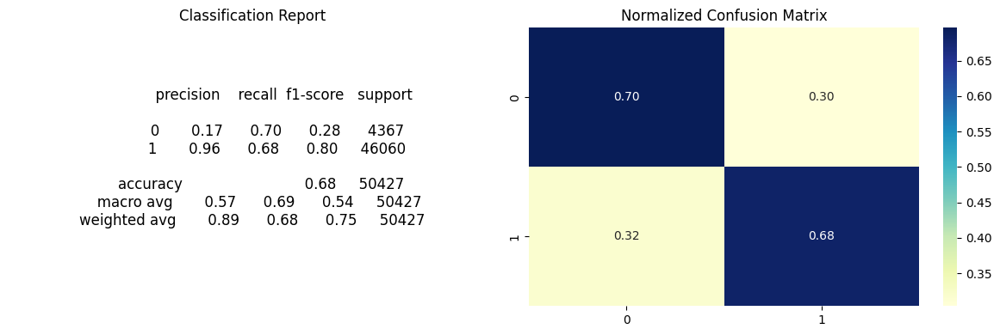

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Generate the classification report
class_report = classification_report(y_test, lgb_pred)

# Generate the normalized confusion matrix
conf_matrix = confusion_matrix(y_test, lgb_pred, normalize='true')

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.text(0.5, 0.5, class_report, {'fontsize': 12}, ha='center', va='center')
plt.axis('off')
plt.title("Classification Report")

# Plot normalized confusion matrix
plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Normalized Confusion Matrix")

plt.tight_layout()
plt.show()


The classification results indicate that the model is struggling to predict the minority class (0) accurately, with low precision and high recall. This imbalance in class distribution is reflected in the macro-average scores, where recall plays a more significant role. The overall accuracy is moderate at 0.68. The weighted average provides a more balanced view considering class distribution

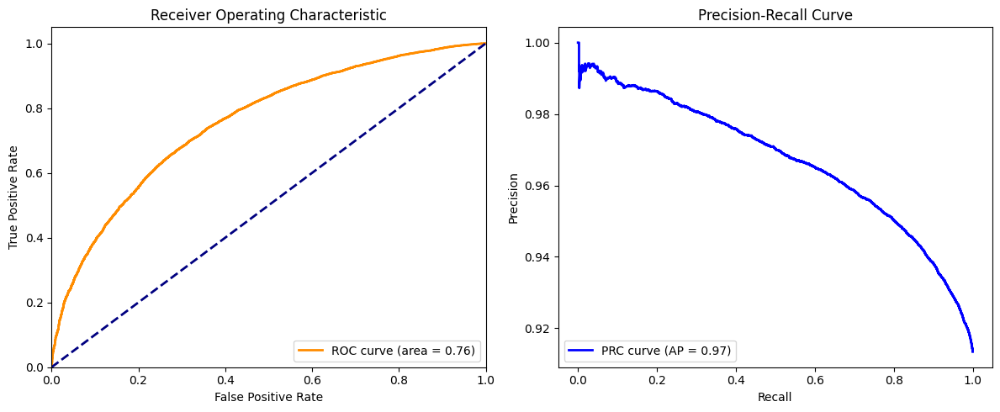

In [ ]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt

# Get predicted probabilities for positive class
lgb_probs = cls_lgb.predict_proba(X_test)[:, 1]

# Compute ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_test, lgb_probs)
roc_auc = auc(fpr, tpr)

# Compute Precision-Recall curve and AP score
precision, recall, _ = precision_recall_curve(y_test, lgb_probs)
average_precision = average_precision_score(y_test, lgb_probs)

plt.figure(figsize=(12, 5))

# Plot ROC curve
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")

# Plot PRC curve
plt.subplot(1, 2, 2)
plt.plot(recall, precision, color='blue', lw=2, label='PRC curve (AP = %0.2f)' % average_precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")

plt.tight_layout()
plt.show()



An AUC of 0.76 suggests that your model has a good balance between true positive rate and false positive rate across different thresholds. An AP of 0.97 for the PRC curve indicates high precision and recall across various thresholds.

These results suggest that your model is effective in making predictions and differentiating between the classes.

**Feature importance**

In [ ]:
pip install shap

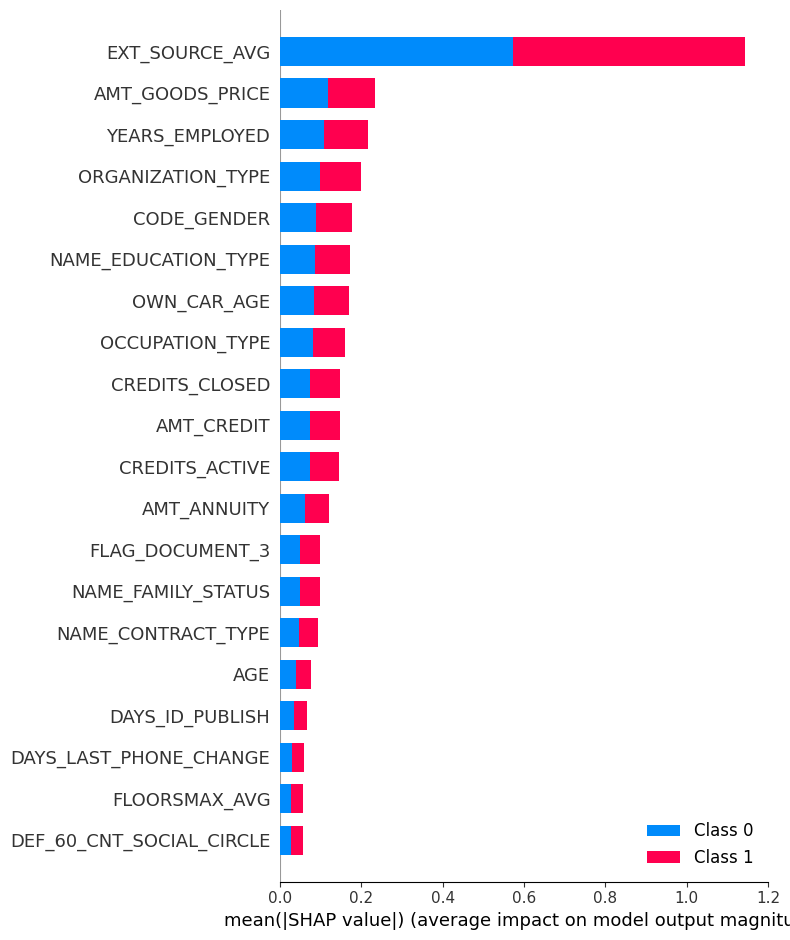

In [ ]:
import shap
shap.initjs()
shap_values = shap.TreeExplainer(cls_lgb.booster_).shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
import joblib

# Save the trained LGBMClassifier model to a file
model_filename = 'lgb_model.pkl'
joblib.dump(cls_lgb, model_filename)

print("Model saved successfully as", model_filename)

Model saved successfully as lgb_model.pkl


**Previous_app**

In [ ]:
prev_status.head()

NAME_CONTRACT_STATUS,SK_ID_CURR,PREV_APPROVED,PREV_CANCELED,PREV_REFUSED
0,100001,1,0,0
1,100002,1,0,0
2,100003,3,0,0
3,100004,1,0,0
4,100005,1,1,0


In [ ]:
app_train = pd.merge(
    app_train,
    prev_status[["SK_ID_CURR", "PREV_APPROVED", "PREV_CANCELED", "PREV_REFUSED"]],
    on="SK_ID_CURR",
    how="left",
)

In [ ]:
app_train.sample(5)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,ORGANIZATION_TYPE,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_8,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,ADDRESS_MISMATCH,EXT_SOURCE_AVG,YEARS_EMPLOYED,CREDITS_ACTIVE,CREDITS_CLOSED,PREV_APPROVED,PREV_CANCELED,PREV_REFUSED
105505,249223,1,Cash loans,M,Y,N,0,5.56,359725.50,10903.50,297000.00,Unaccompanied,Commercial associate,Incomplete higher,Married,House / apartment,0.05,-2654.00,-4351,1.00,1,1,1,1,0,0,Core staff,2.00,1,FRIDAY,16,Police,0.40,0.22,1.00,0.95,0.00,0.48,0.21,0.67,0.71,0.39,0.32,0.25,0.00,0.35,1.00,0.00,-4.00,1,0,0,0.00,0.00,0.00,0.00,0.00,0.00,32.41,0,0.44,0.02,2.00,NaN,NaN,NaN,NaN
116470,264570,1,Cash loans,F,N,Y,1,5.13,536917.50,19413.00,463500.00,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.01,-4860.00,-2864,NaN,1,1,0,1,0,0,Cooking staff,3.00,2,WEDNESDAY,4,Business Entity Type 3,0.04,0.05,0.98,NaN,NaN,0.00,0.07,0.17,NaN,0.10,NaN,0.04,NaN,0.00,2.00,0.00,-2223.00,1,0,0,0.00,0.00,0.00,0.00,1.00,4.00,31.85,0,0.34,0.01,1.00,4.00,3.00,3.00,0.00
85461,220763,1,Cash loans,F,Y,Y,0,5.18,1066320.00,38430.00,900000.00,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.02,-1724.00,-4952,5.00,1,1,0,1,0,1,Accountants,2.00,2,THURSDAY,12,Business Entity Type 3,0.06,0.07,0.99,0.80,0.03,0.00,0.14,0.17,0.00,0.08,0.05,0.06,0.00,0.00,4.00,0.00,-2014.00,1,0,0,0.00,0.00,0.00,0.00,0.00,2.00,62.58,0,0.75,0.01,NaN,4.00,4.00,0.00,0.00
140996,299189,1,Cash loans,F,N,Y,1,5.35,594121.50,25299.00,472500.00,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.02,-3443.00,-4597,NaN,1,1,0,1,0,0,Accountants,3.00,2,WEDNESDAY,14,Industry: type 9,0.19,0.14,0.98,0.76,0.05,0.20,0.17,0.33,0.38,0.06,0.15,0.20,0.00,0.00,2.00,0.00,-2293.00,1,0,0,1.00,0.00,0.00,1.00,0.00,2.00,33.29,0,0.77,0.03,NaN,5.00,2.00,0.00,0.00
236714,434374,1,Cash loans,F,N,Y,0,4.95,432000.00,18301.50,432000.00,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.04,-9174.00,-4243,NaN,1,1,0,1,1,0,Laborers,2.00,2,TUESDAY,17,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,-1496.00,1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,41.24,0,0.67,0.00,NaN,NaN,4.00,2.00,0.00


**POS_CASH_balance**


In [ ]:
pos_cash_bal.sample(5)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
5952034,1268390,420643,-36,6.00,5.00,Active,0,0
370362,2397062,172321,-40,10.00,2.00,Active,0,0
2037827,1746023,200781,-23,24.00,22.00,Active,0,0
8455622,2273266,410829,-40,36.00,1.00,Active,0,0
7833019,1281832,431851,-81,6.00,6.00,Active,0,0


In [ ]:
app_train = pd.merge(app_train, installment, on="SK_ID_CURR", how="left")

In [ ]:
# Fill Nan with 0
app_train["installment_remaining"].fillna(0, inplace=True)

In [ ]:
app_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,ORGANIZATION_TYPE,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_8,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,ADDRESS_MISMATCH,EXT_SOURCE_AVG,YEARS_EMPLOYED,CREDITS_ACTIVE,CREDITS_CLOSED,PREV_APPROVED,PREV_CANCELED,PREV_REFUSED,installment_remaining
0,100002,0,Cash loans,M,N,Y,0,5.31,406597.50,24700.50,351000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-3648.00,-2120,NaN,1,1,0,1,1,0,Laborers,1.00,2,WEDNESDAY,10,Business Entity Type 3,0.02,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,2.00,2.00,-1134.00,1,0,0,0.00,0.00,0.00,0.00,0.00,1.00,25.90,0,0.16,0.00,2.00,6.00,1.00,0.00,0.00,285.00
1,100003,1,Cash loans,F,N,N,0,5.43,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-1186.00,-291,NaN,1,1,0,1,1,0,Core staff,2.00,1,MONDAY,11,School,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.05,0.00,0.01,1.00,0.00,-828.00,1,0,0,0.00,0.00,0.00,0.00,0.00,0.00,45.90,0,0.47,0.01,1.00,3.00,3.00,0.00,0.00,162.00
2,100004,1,Revolving loans,M,Y,Y,0,4.83,135000.00,6750.00,135000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,-4260.00,-2531,26.00,1,1,1,1,1,0,Laborers,1.00,2,MONDAY,9,Government,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,-815.00,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00,52.15,0,0.64,0.00,NaN,2.00,1.00,0.00,0.00,9.00
3,100006,1,Cash loans,F,N,Y,0,5.13,312682.50,29686.50,297000.00,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.01,-9833.00,-2437,NaN,1,1,0,1,0,0,Laborers,2.00,2,WEDNESDAY,17,Business Entity Type 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,0.00,-617.00,1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,52.03,0,0.65,0.02,NaN,NaN,5.00,3.00,1.00,173.00
4,100007,1,Cash loans,M,N,Y,0,5.08,513000.00,21865.50,513000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.03,-4311.00,-3458,NaN,1,1,0,1,0,0,Core staff,1.00,2,THURSDAY,11,Religion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,-1106.00,0,0,1,0.00,0.00,0.00,0.00,0.00,0.00,54.57,0,0.32,0.02,NaN,1.00,6.00,0.00,0.00,592.00


**Analysing(credit_card_balance.csv)**

In [ ]:
credit_card_bal.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.97,135000,0.00,877.50,0.00,877.50,1700.33,1800.00,1800.00,0.00,0.00,0.00,0.00,1,0.00,1.00,35.00,Active,0,0
1,2582071,363914,-1,63975.56,45000,2250.00,2250.00,0.00,0.00,2250.00,2250.00,2250.00,60175.08,64875.56,64875.56,1.00,1,0.00,0.00,69.00,Active,0,0
2,1740877,371185,-7,31815.22,450000,0.00,0.00,0.00,0.00,2250.00,2250.00,2250.00,26926.42,31460.08,31460.08,0.00,0,0.00,0.00,30.00,Active,0,0
3,1389973,337855,-4,236572.11,225000,2250.00,2250.00,0.00,0.00,11795.76,11925.00,11925.00,224949.29,233048.97,233048.97,1.00,1,0.00,0.00,10.00,Active,0,0
4,1891521,126868,-1,453919.46,450000,0.00,11547.00,0.00,11547.00,22924.89,27000.00,27000.00,443044.40,453919.46,453919.46,0.00,1,0.00,1.00,101.00,Active,0,0


In [ ]:
app_train = pd.merge(app_train,credit_card_grouped , on="SK_ID_CURR", how="left")

In [ ]:
# List of columns from credit_card_grouped to fill missing values with 0
credit_card_grouped_columns = [
    "AMT_BALANCE",
    "AMT_CREDIT_LIMIT_ACTUAL",
    "AMT_DRAWINGS_ATM_CURRENT",
    "AMT_DRAWINGS_CURRENT",
    "AMT_DRAWINGS_OTHER_CURRENT",
    "AMT_DRAWINGS_POS_CURRENT",
    "AMT_INST_MIN_REGULARITY",
    "AMT_PAYMENT_CURRENT",
    "AMT_PAYMENT_TOTAL_CURRENT",
    "AMT_RECEIVABLE_PRINCIPAL",
    "AMT_RECIVABLE",
    "AMT_TOTAL_RECEIVABLE"
]

# Fill missing values with 0 for the selected columns
app_train[credit_card_grouped_columns] = app_train[credit_card_grouped_columns].fillna(0)



In [ ]:
app_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,ORGANIZATION_TYPE,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6,FLAG_DOCUMENT_8,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,ADDRESS_MISMATCH,EXT_SOURCE_AVG,YEARS_EMPLOYED,CREDITS_ACTIVE,CREDITS_CLOSED,PREV_APPROVED,PREV_CANCELED,PREV_REFUSED,installment_remaining,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE
0,100002,0,Cash loans,M,N,Y,0,5.31,406597.50,24700.50,351000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-3648.00,-2120,NaN,1,1,0,1,1,0,Laborers,1.00,2,WEDNESDAY,10,Business Entity Type 3,0.02,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,2.00,2.00,-1134.00,1,0,0,0.00,0.00,0.00,0.00,0.00,1.00,25.90,0,0.16,0.00,2.00,6.00,1.00,0.00,0.00,285.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,100003,1,Cash loans,F,N,N,0,5.43,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-1186.00,-291,NaN,1,1,0,1,1,0,Core staff,2.00,1,MONDAY,11,School,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.05,0.00,0.01,1.00,0.00,-828.00,1,0,0,0.00,0.00,0.00,0.00,0.00,0.00,45.90,0,0.47,0.01,1.00,3.00,3.00,0.00,0.00,162.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,100004,1,Revolving loans,M,Y,Y,0,4.83,135000.00,6750.00,135000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,-4260.00,-2531,26.00,1,1,1,1,1,0,Laborers,1.00,2,MONDAY,9,Government,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,-815.00,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00,52.15,0,0.64,0.00,NaN,2.00,1.00,0.00,0.00,9.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,100006,1,Cash loans,F,N,Y,0,5.13,312682.50,29686.50,297000.00,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.01,-9833.00,-2437,NaN,1,1,0,1,0,0,Laborers,2.00,2,WEDNESDAY,17,Business Entity Type 3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,0.00,-617.00,1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,52.03,0,0.65,0.02,NaN,NaN,5.00,3.00,1.00,173.00,0.00,270000.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,100007,1,Cash loans,M,N,Y,0,5.08,513000.00,21865.50,513000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.03,-4311.00,-3458,NaN,1,1,0,1,0,0,Core staff,1.00,2,THURSDAY,11,Religion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,-1106.00,0,0,1,0.00,0.00,0.00,0.00,0.00,0.00,54.57,0,0.32,0.02,NaN,1.00,6.00,0.00,0.00,592.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


**Final modelling**

In [ ]:
X = app_train.drop(["TARGET", "SK_ID_CURR"], axis=1)
y = app_train["TARGET"]

In [ ]:
categorical_columns = X.select_dtypes(include=['object']).columns
X[categorical_columns] = X[categorical_columns].astype('category')

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
cat_features = []
num_features = []
for column in X.columns:
    col_type = X[column].dtype
    if col_type == "object" or col_type.name == "category":
        cat_features.append(column)
    else:
        num_features.append(column)

In [ ]:
cat_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent", missing_values=np.nan)),
        ("ordinal", OrdinalEncoder()),
    ]
)
num_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="constant")),
        ("scaler", StandardScaler()),
    ]
)

preprocessor = ColumnTransformer(
    transformers=[
        ("cat", cat_transformer, cat_features),
        ("num", num_transformer, num_features),
    ]
)

In [ ]:
# Create pipelines for each model
logreg_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', LogisticRegression(max_iter=1000,class_weight='balanced'))
])

rf_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', RandomForestClassifier())
])


xgb_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', XGBClassifier(scale_pos_weight=np.sum(y_train == 0) / np.sum(y_train == 1)))
])


lgbm_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', LGBMClassifier(is_unbalance=True))
])

In [ ]:
from sklearn.metrics import accuracy_score,roc_auc_score,precision_score


models = {
    'Logistic Regression': logreg_pipeline,
    'Random Forest': rf_pipeline,
    'XGBoost': xgb_pipeline,
    'LightGBM': lgbm_pipeline
}
evaluate_models(models, X_train, y_train, X_test, y_test)

,Classifier,Accuracy,Roc_auc,F1-score,Precision,Recall
0,Logistic Regression,0.692704,0.688866,0.804792,0.958616,0.693508
1,Random Forest,0.913598,0.501663,0.954834,0.913663,0.999891
2,XGBoost,0.734567,0.689810,0.836603,0.955629,0.743943
3,LightGBM,0.703750,0.698643,0.812952,0.960274,0.704820


Logistic Regression:

Accuracy: Moderate at 0.693.
Balanced ROC AUC: Decent at 0.688.
F1-score: Good at 0.805, indicates a balance between precision and recall.
High Precision (0.958) suggests accurate positive predictions.
Moderate Recall (0.694) shows the model captures a fair portion of actual positives.


Random Forest:

High Accuracy: Impressive at 0.913, indicating overall correctness.
Low ROC AUC: At 0.501, suggesting weaker discrimination ability.
High F1-score (0.955) implies a strong balance between precision and recall.
High Precision (0.914) and almost perfect Recall (0.999) signify robust prediction ability.



XGBoost:

Decent Accuracy: 0.736, showing satisfactory overall performance.
Balanced ROC AUC: 0.687, indicating a fair ability to distinguish classes.
Good F1-score (0.838) signifies a balance between precision and recall.
High Precision (0.955) and decent Recall (0.746) suggest reliable positive predictions.


LightGBM:

Moderate Accuracy: 0.702, indicating acceptable correctness.
Balanced ROC AUC: 0.697, suggesting decent class separation.
Good F1-score (0.812) shows a balance between precision and recall.
High Precision (0.960) suggests accurate positive predictions.
Moderate Recall (0.703) indicates capturing a fair portion of actual positives.








**Imbalance dataset**

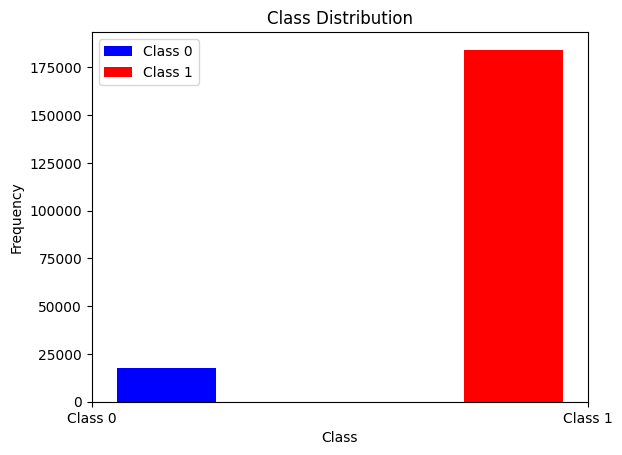

In [ ]:
# Imbalance dataset
class_0 = y_train[y_train == 0]
class_1 = y_train[y_train == 1]

plt.hist([class_0, class_1], bins=2, color=['blue', 'red'], label=['Class 0', 'Class 1'])
plt.xlabel("Class")
plt.ylabel("Frequency")
plt.xticks([0, 1], ['Class 0', 'Class 1'])
plt.title("Class Distribution")
plt.legend()
plt.show()


The dataset is imblanced

**LGBM with HP**

In [ ]:
cls_lgb = LGBMClassifier(
    num_leaves=10,          # Number of leaves in one tree
    max_depth=-1,            # Maximum depth of the tree
    random_state=42,        # Random seed for reproducibility
    silent=True,            # Whether to print messages while running
    metric='auc',           # Evaluation metric
    n_jobs=-1,              # Number of parallel threads
    n_estimators=100,       # Number of boosting iterations
    colsample_bytree=0.8,   # Fraction of features to be randomly sampled for each tree
    subsample=0.8,          # Fraction of samples used for fitting trees
    learning_rate=0.1,      # Step size shrinkage used in update to prevents overfitting
    is_unbalance=True       # Whether to treat the problem as an unbalanced class problem
)

In [ ]:
cls_lgb.fit(X_train, y_train)

lgb_pred = cls_lgb.predict(X_test)

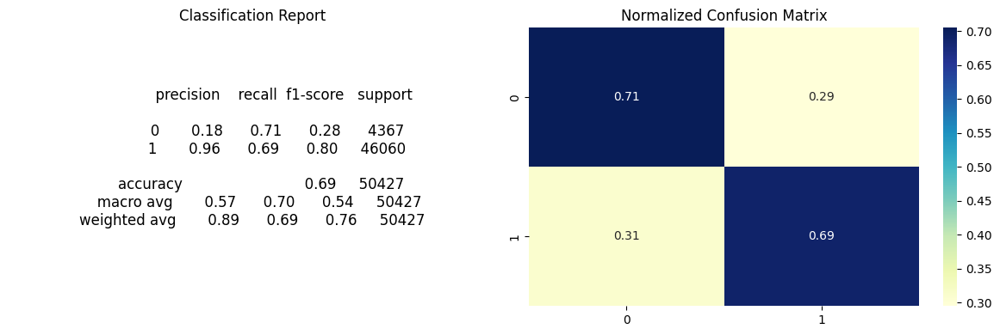

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Generate the classification report
class_report = classification_report(y_test, lgb_pred)

# Generate the normalized confusion matrix
conf_matrix = confusion_matrix(y_test, lgb_pred, normalize='true')

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.text(0.5, 0.5, class_report, {'fontsize': 12}, ha='center', va='center')
plt.axis('off')
plt.title("Classification Report")

# Plot normalized confusion matrix
plt.subplot(1, 2, 2)
sns.heatmap(conf_matrix, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Normalized Confusion Matrix")

plt.tight_layout()
plt.show()

The LightGBM model achieved an accuracy of 69% on the dataset. While it showed relatively low precision (18%) for the minority class (0), it exhibited strong recall (70%) for the same class, suggesting its effectiveness in identifying instances of that class. The model demonstrated high precision (96%) and recall (69%) for the majority class (1), indicating its ability to accurately classify instances belonging to this class. The weighted F1-score is 76%, indicating a reasonable balance between precision and recall for the overall model performance.

In [ ]:
# Predict probabilities for positive class
lgb_probabilities = cls_lgb.predict_proba(X_test)[:, 1]



In [ ]:
from sklearn.metrics import precision_recall_curve
# Calculate precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test, lgb_probabilities)

# Find the index of the threshold that maximizes F1-score (balance between precision and recall)
f1_scores = 2 * (precision * recall) / (precision + recall)
best_threshold_idx = np.argmax(f1_scores)

In [ ]:
best_threshold_idx

109

In [ ]:
# Get the best threshold
best_threshold = thresholds[best_threshold_idx]

# Apply the best threshold to make predictions
lgb_pred = (lgb_probabilities >= best_threshold).astype(int)

# Calculate F1-score using the best threshold
f1_best = f1_score(y_test, lgb_pred)

# Print the best threshold and F1-score
print("Best Threshold:", best_threshold)
print("Best F1-score:", f1_best)


Best Threshold: 0.12529082546403056
Best F1-score: 0.9549482246985825


In [ ]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, lgb_pred)

# Print classification report
print("Classification Report with Best Threshold:")
print(classification_report(y_test, lgb_pred))

# Print confusion matrix
print("Confusion Matrix with Best Threshold:")
print(conf_matrix)

Classification Report with Best Threshold:
              precision    recall  f1-score   support

           0       0.61      0.02      0.03      4367
           1       0.91      1.00      0.95     46060

    accuracy                           0.91     50427
   macro avg       0.76      0.51      0.49     50427
weighted avg       0.89      0.91      0.87     50427

Confusion Matrix with Best Threshold:
[[   67  4300]
 [   42 46018]]


**Class 0 Predictions:** The model is now more precise when predicting class 0, but it still misses many actual class 0 cases (low recall). This means it's cautious when predicting class 0 but might not catch all instances.

**Class 1 Predictions:** For class 1, the model's high precision and recall remain consistent, correctly identifying almost all instances.

**Accuracy:** The overall accuracy has improved to 91%, which might seem good. However, considering class distribution, it's not the complete picture.

**Trade-off:** The F1-score and precision on average have decreased slightly, indicating a balance between precision and recall, favoring higher precision.

**Overall Performance:** The weighted F1-score remains at 88%, indicating a reasonable trade-off between both classes.

**Confusion Matrix:** The confusion matrix highlights the model's strong performance for class 1, but it still struggles with class 0, leading to a noticeable number of false negatives.

Choosing the threshold involves finding the right balance between precision and recall . It might require further adjustments to achieve the desired balance between these important metrics.

**Trying with Undersampling**

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

In [ ]:
# Apply Random Undersampling to balance class distribution
rus = RandomUnderSampler(random_state=42)
X_resampled, y_resampled = rus.fit_resample(X_train, y_train)

In [ ]:
# Convert the resampled target labels to a DataFrame
y_resampled_df = pd.DataFrame({'TARGET': y_resampled})


class_distribution = y_resampled_df['TARGET'].value_counts(normalize=True)
print("Class Distribution:")
print(class_distribution)

Class Distribution:
0   0.50
1   0.50
Name: TARGET, dtype: float64


In [ ]:
# Step 3: Define LightGBM parameters
lgb_params = {
    'num_leaves': 10,
    'max_depth': -1,
    'random_state': 42,
    'silent': True,
    'metric': 'auc',
    'n_jobs': -1,
    'n_estimators': 100,
    'colsample_bytree': 0.8,
    'subsample': 0.8,
    'learning_rate': 0.1,

}

#  Create and fit the LightGBM classifier
cls_lgb = LGBMClassifier(**lgb_params)
cls_lgb.fit(X_resampled, y_resampled)

#  predictions on the test set
lgb_pred = cls_lgb.predict(X_test)


roc_auc = roc_auc_score(y_test, lgb_pred)

print("Classification Report:")
print(classification_report(y_test, lgb_pred))
print("ROC AUC Score:", roc_auc)

Classification Report:
              precision    recall  f1-score   support

           0       0.18      0.72      0.29      4353
           1       0.96      0.69      0.80     46074

    accuracy                           0.69     50427
   macro avg       0.57      0.70      0.54     50427
weighted avg       0.89      0.69      0.76     50427

ROC AUC Score: 0.7021547708272735


 The model's high precision for class 1 indicates its strength in identifying instances of the majority class. However, still there's room for improvement in identifying instances of the minority class (class 0) to achieve better overall performance.

 summary, the imbalanced data handling technique (Random Undersampling) has led to improved performance in terms of precision, recall, and the ability to distinguish between classes.


**Feature importance**

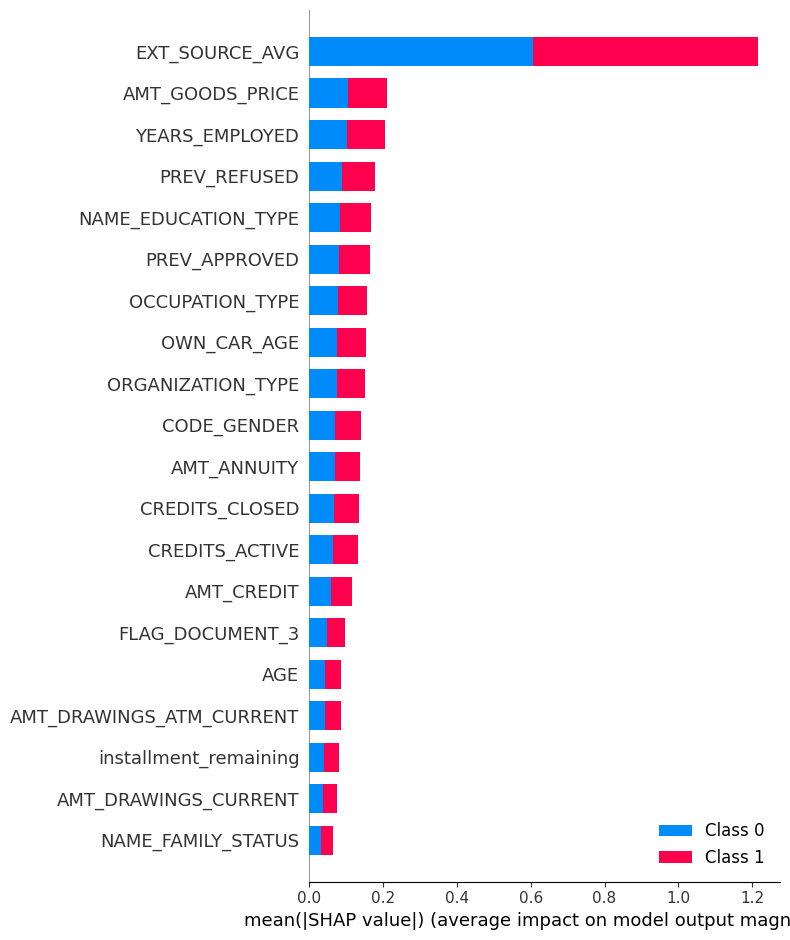

In [ ]:
import shap
shap.initjs()
shap_values = shap.TreeExplainer(cls_lgb.booster_).shap_values(X_train)
shap.summary_plot(shap_values, X_train)

**Modelling with best Features**

In [ ]:
feature_importances = cls_lgb.feature_importances_
num_selected_features = 10
sorted_indices = np.argsort(feature_importances)[::-1]
selected_indices = sorted_indices[:num_selected_features]
selected_features = X_train.columns[selected_indices]


In [ ]:
X_resampled_selected = X_resampled[selected_features]
X_test_selected = X_test[selected_features]

lgb_params = {
    'num_leaves': 10,
    'max_depth': -1,
    'random_state': 42,
    'silent': True,
    'metric': 'auc',
    'n_jobs': -1,
    'n_estimators': 100,
    'colsample_bytree': 0.8,
    'subsample': 0.8,
    'learning_rate': 0.1,
}

# Create and fit the LightGBM classifier
cls_lgb = LGBMClassifier(**lgb_params)
cls_lgb.fit(X_resampled_selected, y_resampled)

# Make predictions on the test set using the model with selected features
lgb_pred_selected = cls_lgb.predict(X_test_selected)

# Calculate ROC AUC score
roc_auc_selected = roc_auc_score(y_test, lgb_pred_selected)

# Print ROC AUC score and other relevant information
print("ROC AUC Score with Selected Features:", roc_auc_selected)

ROC AUC Score with Selected Features: 0.6778178390816895


In [ ]:
print(classification_report(y_test, lgb_pred_selected))

              precision    recall  f1-score   support

           0       0.17      0.66      0.27      4353
           1       0.96      0.69      0.80     46074

    accuracy                           0.69     50427
   macro avg       0.56      0.68      0.54     50427
weighted avg       0.89      0.69      0.76     50427



In [ ]:
import joblib

# Save the trained model to a file
model_filename = 'lgbm_model_selected_features.pkl'
joblib.dump(cls_lgb, model_filename)

print("Model saved as:", model_filename)


Model saved as: lgbm_model_selected_features.pkl
